# **Assignment 2**

## Time Series Learning

## Inbal Bitton and Shachar Meretz

In this part of the assignment we will present an analysis of a data set containing data and indices measured for a number of subjects who were asked to perform a particular protocol containing a number of physical activities that the subjects performed, and our goal is to use this data collected from the subjects to classify what activity was performed.



Now we define a number of functions that we will work with during the assignment - in some of the steps we will load the training data set containing the subjects 101,102,103,104,105,106,109 and the test set containing the subjects 107 and 108.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from matplotlib import cm
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,log_loss
import seaborn as sns
from scipy.stats import entropy
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.layers import Flatten,Dense,LSTM,TimeDistributed,Input,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
Train_csv_dir = r'/content/drive/MyDrive/DL_Ass2/Protocol_CSV/Train'
Test_csv_dir = r'/content/drive/MyDrive/DL_Ass2/Protocol_CSV/Test'
Train_csv_Opt_dir = r'/content/drive/MyDrive/DL_Ass2/Optional_CSV/Train'
Test_csv_Opt_dir = r'/content/drive/MyDrive/DL_Ass2/Optional_CSV/Test'
Main_Dir = r'/content/drive/MyDrive/DL_Ass2'

In [4]:
Total_Records_For_Each_Activity = {}
Total_Records_For_Each_Subject = {}

In [5]:
def read_subject_CSV_to_df(file_path):
    df = pd.read_csv(file_path, engine='python')
    return df

In [6]:
def get_activities_df():
    df = pd.read_csv(r'{}/activities_map.csv'.format(Main_Dir) , engine='python')
    return df

In [7]:
Col_Names = ['index','Time Stamp' , 'Activity ID' , 'Heart Rate']

for var in ['Hand' , 'Chest' , 'Ankle']:
    Col_Names.append('{} Temperature'.format(var))
    
    Col_Names.append('{} 3D Acceleration Data_16_X'.format(var))
    Col_Names.append('{} 3D Acceleration Data_16_Y'.format(var))
    Col_Names.append('{} 3D Acceleration Data_16_Z'.format(var))
    
    Col_Names.append('{} 3D Acceleration Data_6_X'.format(var))
    Col_Names.append('{} 3D Acceleration Data_6_Y'.format(var))
    Col_Names.append('{} 3D Acceleration Data_6_Z'.format(var))
    
    Col_Names.append('{} 3D Gyroscope Data_X'.format(var))
    Col_Names.append('{} 3D Gyroscope Data_Y'.format(var))
    Col_Names.append('{} 3D Gyroscope Data_Z'.format(var))
    
    Col_Names.append('{} 3D Magnetometer Data_X'.format(var))
    Col_Names.append('{} 3D Magnetometer Data_Y'.format(var))
    Col_Names.append('{} 3D Magnetometer Data_Z'.format(var))
    
    Col_Names.append('{} Orientation_X'.format(var))
    Col_Names.append('{} Orientation_Y'.format(var))
    Col_Names.append('{} Orientation_Z'.format(var))
    Col_Names.append('{} Orientation_W'.format(var))
    

In the pre-processing of the data we will remove the records relating to activity 0 as detailed in the task description file - this activity was obtained when there is no indication of the activity that the subject was asked to perform so we will remove these records so we not include them in the learning process. In addition we will have to deal with missing values ​​- we will fill these missing values ​​by using the mean value of each measure

In [8]:
def pre_process_data(df):
    df.interpolate(inplace=True)
    for col in df.columns:
        if col != "Name":
            df[col] = df[col].fillna(df[col].mean())
    df['sec index'] = 1
    for act in [12,13]:
        filtered = df[df['Activity ID'] == act]
        if filtered.empty:
            continue
        time_stamps = list(filtered['Time Stamp'])
        i = 0
        delta = float(time_stamps[i+1] - time_stamps[i])
        while delta <= 0.01 or delta <= 0.02:
            i += 1
            delta = time_stamps[i+1] - time_stamps[i]
        df[(df['Activity ID'] == act)].iloc[i:]['sec index'] = 2
    return df

In the pre-processing data for the LSTM model we will want to fill in missing values ​​and remove activity 0, and in addition to normalize the values ​​that will be between 0-1. This will help us deal with the memory problem we will need to implement the operations with this model and in addition learning will be faster and more efficient by using this range of values.

In [9]:
def pre_process_data_LSTM(df):
    df.interpolate(inplace=True)
    for col in df.columns:
        if col != "Name":
            df[col] = df[col].fillna(df[col].mean())

    name_col = df['Name']
    activity_col = df['Activity ID']
    time_stamps_col = df['Time Stamp']
    df.drop(['Name','Activity ID','Time Stamp'],axis=1,inplace=True)
    scaler = MinMaxScaler()
    scaler.fit(df)
    df = scaler.transform(df)
    new_df = pd.DataFrame(df)
    new_df = new_df.astype(np.float16)
    new_df['Name'] = name_col
    new_df['Activity ID'] = activity_col
    new_df['Time Stamp'] = time_stamps_col
    new_df['sec index'] = 1
    for act in [12,13]:
        filtered = new_df[new_df['Activity ID'] == act]
        if filtered.empty:
            continue
        time_stamps = list(filtered['Time Stamp'])
        i = 0
        delta = float(time_stamps[i+1] - time_stamps[i])
        while delta <= 0.01 or delta <= 0.02:
            i += 1
            delta = time_stamps[i+1] - time_stamps[i]
        new_df[(new_df['Activity ID'] == act)].iloc[i:]['sec index'] = 2
    return new_df

Loading Activites Table - for each Activity ID we can get her name

In [10]:
activities_df = get_activities_df()
Activities = list(activities_df[activities_df.ID != 0]['Activity'])
Activities_id = activities_df[activities_df.ID != 0]['ID']


In [11]:
def load_data(dir , opt_dir='' , opt=True):
  data = pd.DataFrame()
  for file in os.listdir(dir):
      df = read_subject_CSV_to_df(os.path.join(dir , file))
      subject_name = file.split('.')[0]
      df['Name'] = subject_name
      data = data.append(df[df[df.columns[2]]!=0] , ignore_index=True)
  if opt:
    for file in os.listdir(opt_dir):
        df = read_subject_CSV_to_df(os.path.join(opt_dir , file))
        subject_name = file.split('.')[0]
        df['Name'] = subject_name
        data = data.append(df[df[df.columns[2]]!=0] , ignore_index=True)
  return data



In [12]:
def remove_columns(df,oriantation=True , acc_16=False , acc_6=False , gyro=False , magno=False):
  for col in df.columns:
    if "Orientation" in col and oriantation:
        df.drop(col,axis=1,inplace=True)
    if "Acceleration Data_16" in col and acc_16:
        df.drop(col,axis=1,inplace=True)
    if "Acceleration Data_6" in col and acc_6:
        df.drop(col,axis=1,inplace=True)
    if "Gyroscope" in col and gyro:
        df.drop(col,axis=1,inplace=True)
    if "Magnetometer" in col and magno:
        df.drop(col,axis=1,inplace=True)
  return df


# **Section 1**

## **Our Data Set**

The Data set contains data from 3 sensors worn on 9 subjects - 8 male and 1 female.The Subjects were asked to perform activities from a list of 12 activities listed below. The three sensors are located on the hand, center of mass (chest) and ankle.The sensors measure a number of indices within a time frame of 0.01 seconds and in addition to the sensors' indices we measure the heart rate of the subject at each timestamp.

Since this is a short time frame and metrics obtained from sensors, we will have to deal with missing values. We will fill these missing values for each subject by finding the mean value for that measure.

Our problem presented here is a classification problem within Time series  - for a given section of time we want to know, according to the metrics that have been studied and measured that presented to us in the data set, what physical activity that person performs. Therefore we will need to prepare our data set and study it in a generic way and not for each subject individually.

We will prepare the data by dealing with missing values, deleting records in which we do not have a classification of a particular activity (activities with the identification number 0) and consolidating the subjects' records into one large table.

Our training set was built using subjects 101,102,103,104,105,106,109 - we will split this sat to train and validation

And our test set was built using subjects 107,108 

For each data set we will add 2 columns that will help us prepare the data for learning - a column for the subject's name, a column that will be an indication to us of the continuous execution of a particular activity - "sec index". 

In addition the "Activity ID" and "Time Stamp" column will not be features in the learning process.

In [ ]:
Train_Set = load_data(Train_csv_dir , Train_csv_Opt_dir)
Train_Set.columns = Col_Names + ['Name'] 
Train_Set.drop('index',axis=1,inplace=True) 
Train_Set.head()

,Time Stamp,Activity ID,Heart Rate,Hand Temperature,Hand 3D Acceleration Data_16_X,Hand 3D Acceleration Data_16_Y,Hand 3D Acceleration Data_16_Z,Hand 3D Acceleration Data_6_X,Hand 3D Acceleration Data_6_Y,Hand 3D Acceleration Data_6_Z,Hand 3D Gyroscope Data_X,Hand 3D Gyroscope Data_Y,Hand 3D Gyroscope Data_Z,Hand 3D Magnetometer Data_X,Hand 3D Magnetometer Data_Y,Hand 3D Magnetometer Data_Z,Hand Orientation_X,Hand Orientation_Y,Hand Orientation_Z,Hand Orientation_W,Chest Temperature,Chest 3D Acceleration Data_16_X,Chest 3D Acceleration Data_16_Y,Chest 3D Acceleration Data_16_Z,Chest 3D Acceleration Data_6_X,Chest 3D Acceleration Data_6_Y,Chest 3D Acceleration Data_6_Z,Chest 3D Gyroscope Data_X,Chest 3D Gyroscope Data_Y,Chest 3D Gyroscope Data_Z,Chest 3D Magnetometer Data_X,Chest 3D Magnetometer Data_Y,Chest 3D Magnetometer Data_Z,Chest Orientation_X,Chest Orientation_Y,Chest Orientation_Z,Chest Orientation_W,Ankle Temperature,Ankle 3D Acceleration Data_16_X,Ankle 3D Acceleration Data_16_Y,Ankle 3D Acceleration Data_16_Z,Ankle 3D Acceleration Data_6_X,Ankle 3D Acceleration Data_6_Y,Ankle 3D Acceleration Data_6_Z,Ankle 3D Gyroscope Data_X,Ankle 3D Gyroscope Data_Y,Ankle 3D Gyroscope Data_Z,Ankle 3D Magnetometer Data_X,Ankle 3D Magnetometer Data_Y,Ankle 3D Magnetometer Data_Z,Ankle Orientation_X,Ankle Orientation_Y,Ankle Orientation_Z,Ankle Orientation_W,Name
0,37.66,1,NaN,30.375,2.21530,8.27915,5.58753,2.24689,8.55387,5.77143,-0.004750,0.037579,-0.011145,8.93200,-67.9326,-19.9755,1.0,0.0,0.0,0.0,32.1875,0.124482,9.65003,-1.65181,0.143941,9.71019,-1.47347,0.036668,0.016559,-0.052791,0.567566,-50.7269,44.2728,1.0,0.0,0.0,0.0,30.75,9.73855,-1.84761,0.095156,9.63162,-1.76757,0.265761,0.002908,-0.027714,0.001752,-61.1081,-36.8636,-58.3696,1.0,0.0,0.0,0.0,subject101
1,37.67,1,NaN,30.375,2.29196,7.67288,5.74467,2.27373,8.14592,5.78739,-0.171710,0.025479,-0.009538,9.58300,-67.9584,-20.9091,1.0,0.0,0.0,0.0,32.1875,0.200711,9.64980,-1.65043,0.129092,9.74041,-1.47329,0.019343,-0.024304,-0.059843,0.904990,-50.5080,43.5427,1.0,0.0,0.0,0.0,30.75,9.69762,-1.88438,-0.020804,9.58649,-1.75247,0.250816,0.020882,0.000945,0.006007,-60.8916,-36.3197,-58.3656,1.0,0.0,0.0,0.0,subject101
2,37.68,1,NaN,30.375,2.29090,7.14240,5.82342,2.26966,7.66268,5.78846,-0.238241,0.011214,0.000831,9.05516,-67.4017,-19.5083,1.0,0.0,0.0,0.0,32.1875,0.270277,9.72331,-1.88174,0.144685,9.77048,-1.41285,-0.001428,0.038466,-0.046464,0.455480,-50.7209,44.0259,1.0,0.0,0.0,0.0,30.75,9.69633,-1.92203,-0.059173,9.60196,-1.73721,0.356632,-0.035392,-0.052422,-0.004882,-60.3407,-35.7842,-58.6119,1.0,0.0,0.0,0.0,subject101
3,37.69,1,NaN,30.375,2.21800,7.14365,5.89930,2.22177,7.25535,5.88000,-0.192912,0.019053,0.013374,9.92698,-67.4387,-20.5602,1.0,0.0,0.0,0.0,32.1875,0.236737,9.72447,-1.72746,0.174402,9.75538,-1.45841,0.017277,-0.048547,-0.074946,0.324284,-50.1544,43.6570,1.0,0.0,0.0,0.0,30.75,9.66370,-1.84714,0.094385,9.58674,-1.78264,0.311453,-0.032514,-0.018844,0.026950,-60.7646,-37.1028,-57.8799,1.0,0.0,0.0,0.0,subject101
4,37.70,1,100.0,30.375,2.30106,7.25857,6.09259,2.20720,7.24042,5.95555,-0.069961,-0.018328,0.004582,9.15626,-67.1825,-20.0857,1.0,0.0,0.0,0.0,32.1875,0.352225,9.72437,-1.68665,0.173568,9.69512,-1.53414,0.000275,-0.013352,-0.039315,0.462317,-50.7110,42.9228,1.0,0.0,0.0,0.0,30.75,9.77578,-1.88582,0.095775,9.64677,-1.75240,0.295902,0.001351,-0.048878,-0.006328,-60.2040,-37.1225,-57.8847,1.0,0.0,0.0,0.0,subject101


Here we can see the amount of missing values ​​we have for the various indices before we process the information and prepare the data

In [ ]:
Train_Set.isna().sum()

Time Stamp                               0
Activity ID                              0
Heart Rate                         1888061
Hand Temperature                      9137
Hand 3D Acceleration Data_16_X        9137
Hand 3D Acceleration Data_16_Y        9137
Hand 3D Acceleration Data_16_Z        9137
Hand 3D Acceleration Data_6_X         9137
Hand 3D Acceleration Data_6_Y         9137
Hand 3D Acceleration Data_6_Z         9137
Hand 3D Gyroscope Data_X              9137
Hand 3D Gyroscope Data_Y              9137
Hand 3D Gyroscope Data_Z              9137
Hand 3D Magnetometer Data_X           9137
Hand 3D Magnetometer Data_Y           9137
Hand 3D Magnetometer Data_Z           9137
Hand Orientation_X                    9137
Hand Orientation_Y                    9137
Hand Orientation_Z                    9137
Hand Orientation_W                    9137
Chest Temperature                     1623
Chest 3D Acceleration Data_16_X       1623
Chest 3D Acceleration Data_16_Y       1623
Chest 3D Ac

We want to fill in the missing data and remove columns that are not relevant or we do not want to generalize because of a place in memory.

We will now process and prepare the data for the training set and delete the last four columns we have for each IMU sensor, according to the information we have on the data these columns contain data that is not relevant to this problem.

The columns we remove are - "Orientation_X","Orientation_Y","Orientation_Z","Orientation_W" - for Each IMU

In [ ]:
Train_Set = remove_columns(Train_Set)
Train_Set = pre_process_data(Train_Set)

The Number of Samples in Train Set - number of features or "Channels" in the future is - 40 (not including columns - "Name", "Activity ID", "sec index", "Time Stamp")


In [ ]:
Train_Set.shape

(2077883, 44)

The same process will be performed on the test set as well

In [ ]:
Test_Set = load_data(Test_csv_dir , Test_csv_Opt_dir)
Test_Set.columns = Col_Names + ['Name'] 
Test_Set.drop('index',axis=1,inplace=True) 
Test_Set.head()

,Time Stamp,Activity ID,Heart Rate,Hand Temperature,Hand 3D Acceleration Data_16_X,Hand 3D Acceleration Data_16_Y,Hand 3D Acceleration Data_16_Z,Hand 3D Acceleration Data_6_X,Hand 3D Acceleration Data_6_Y,Hand 3D Acceleration Data_6_Z,Hand 3D Gyroscope Data_X,Hand 3D Gyroscope Data_Y,Hand 3D Gyroscope Data_Z,Hand 3D Magnetometer Data_X,Hand 3D Magnetometer Data_Y,Hand 3D Magnetometer Data_Z,Hand Orientation_X,Hand Orientation_Y,Hand Orientation_Z,Hand Orientation_W,Chest Temperature,Chest 3D Acceleration Data_16_X,Chest 3D Acceleration Data_16_Y,Chest 3D Acceleration Data_16_Z,Chest 3D Acceleration Data_6_X,Chest 3D Acceleration Data_6_Y,Chest 3D Acceleration Data_6_Z,Chest 3D Gyroscope Data_X,Chest 3D Gyroscope Data_Y,Chest 3D Gyroscope Data_Z,Chest 3D Magnetometer Data_X,Chest 3D Magnetometer Data_Y,Chest 3D Magnetometer Data_Z,Chest Orientation_X,Chest Orientation_Y,Chest Orientation_Z,Chest Orientation_W,Ankle Temperature,Ankle 3D Acceleration Data_16_X,Ankle 3D Acceleration Data_16_Y,Ankle 3D Acceleration Data_16_Z,Ankle 3D Acceleration Data_6_X,Ankle 3D Acceleration Data_6_Y,Ankle 3D Acceleration Data_6_Z,Ankle 3D Gyroscope Data_X,Ankle 3D Gyroscope Data_Y,Ankle 3D Gyroscope Data_Z,Ankle 3D Magnetometer Data_X,Ankle 3D Magnetometer Data_Y,Ankle 3D Magnetometer Data_Z,Ankle Orientation_X,Ankle Orientation_Y,Ankle Orientation_Z,Ankle Orientation_W,Name
0,84.28,1,NaN,30.1875,-9.62005,2.67684,0.926122,-9.46309,2.71374,0.903551,0.011622,0.019711,-0.062479,48.1327,11.2280,9.44988,0.677891,-0.423663,-0.530514,0.282009,32.5625,1.68139,9.76549,-0.539797,1.42894,9.70580,-0.393129,0.008242,-0.018560,-0.026403,-2.86061,-36.3764,29.2249,0.476526,-0.570069,-0.450644,-0.494838,30.0,9.54517,-0.492300,-3.00240,9.40911,-0.394953,-2.76452,0.006833,-0.013777,0.024738,-54.0963,-43.0364,-1.710570,0.471341,-0.445500,0.668089,-0.364725,subject107
1,84.29,1,NaN,30.1875,-9.62566,2.63756,0.772221,-9.49348,2.72902,0.858246,0.014394,0.020437,-0.038187,47.3961,10.6468,9.32366,0.677789,-0.423596,-0.530593,0.282203,32.5625,1.65387,9.88090,-0.192182,1.42969,9.79631,-0.362645,0.011283,-0.058740,-0.025865,-1.82456,-36.9306,29.3763,0.476903,-0.570187,-0.450532,-0.494440,30.0,9.54537,-0.454331,-3.00264,9.40919,-0.334435,-2.74958,0.002593,-0.012849,0.021584,-53.8479,-42.7917,-1.851810,0.471472,-0.445282,0.668150,-0.364709,subject107
2,84.30,1,NaN,30.1875,-9.31827,2.78799,0.891780,-9.52324,2.81981,0.812775,0.019775,0.046529,-0.035604,48.1501,10.1100,9.19416,0.677595,-0.423636,-0.530758,0.282301,32.5625,1.45519,9.84203,-0.466702,1.38529,9.79624,-0.241477,0.007567,-0.053458,-0.006914,-2.59905,-36.6440,29.2282,0.476910,-0.570303,-0.450404,-0.494417,30.0,9.51116,-0.683191,-2.84721,9.49966,-0.470428,-2.65881,-0.019102,0.029193,0.006167,-53.5679,-43.4465,-0.857242,0.471577,-0.445313,0.668046,-0.364728,subject107
3,84.31,1,NaN,30.1875,-9.35766,2.75000,0.852831,-9.50791,2.81972,0.842961,0.026513,-0.011152,-0.039049,47.7568,11.6202,9.18579,0.677561,-0.423592,-0.530532,0.282872,32.5625,1.64701,9.87934,-0.424627,1.37045,9.85669,-0.271437,-0.019271,0.001162,0.003869,-2.47723,-36.6489,29.6521,0.476880,-0.570232,-0.450327,-0.494598,30.0,9.50755,-0.530031,-3.00256,9.40938,-0.561235,-2.68831,0.029349,0.024381,0.021216,-53.8327,-42.9179,-0.716955,0.471530,-0.445368,0.667927,-0.364940,subject107
4,84.32,1,NaN,30.1875,-9.39706,2.71202,0.813881,-9.44637,2.86469,0.948505,0.001528,0.000790,-0.044839,47.8825,10.8696,10.23990,0.677514,-0.423499,-0.530740,0.282734,32.5625,1.48614,9.72739,-0.698094,1.35431,9.79652,-0.392415,-0.015039,-0.005531,0.009900,-2.34069,-36.3953,28.9466,0.476896,-0.570218,-0.450230,-0.494687,30.0,9.50825,-0.606290,-2.96349,9.39431,-0.485632,-2.70361,-0.005449,-0.047885,-0.011850,-53.8284,-43.0464,-0.574958,0.471367,-0.445625,0.667963,-0.364770,subject107


Amount of missing values 

In [ ]:
Test_Set.isna().sum()

Time Stamp                              0
Activity ID                             0
Heart Rate                         588065
Hand Temperature                     2731
Hand 3D Acceleration Data_16_X       2731
Hand 3D Acceleration Data_16_Y       2731
Hand 3D Acceleration Data_16_Z       2731
Hand 3D Acceleration Data_6_X        2731
Hand 3D Acceleration Data_6_Y        2731
Hand 3D Acceleration Data_6_Z        2731
Hand 3D Gyroscope Data_X             2731
Hand 3D Gyroscope Data_Y             2731
Hand 3D Gyroscope Data_Z             2731
Hand 3D Magnetometer Data_X          2731
Hand 3D Magnetometer Data_Y          2731
Hand 3D Magnetometer Data_Z          2731
Hand Orientation_X                   2731
Hand Orientation_Y                   2731
Hand Orientation_Z                   2731
Hand Orientation_W                   2731
Chest Temperature                    1435
Chest 3D Acceleration Data_16_X      1435
Chest 3D Acceleration Data_16_Y      1435
Chest 3D Acceleration Data_16_Z   

In [ ]:
Test_Set = remove_columns(Test_Set)
Test_Set = pre_process_data(Test_Set)
Test_Set.shape

(647070, 44)

## **Exploratory Data Analysis**

In [ ]:
def show_time_for_activities(data , Activities , Activities_id):
    total_time_for_activities_df = pd.DataFrame()
    total_time_for_activities_df['Activity'] = Activities
    for subject in data['Name'].unique():
        subject_data = data[data['Name'] == subject]
        activities_time = []
        for act_id in Activities_id:
            filter_by_activity = subject_data[subject_data['Activity ID'] == act_id]
            total_time = 0
            if not filter_by_activity.empty:
                time_stamps = list(filter_by_activity['Time Stamp'])
                total_time = time_stamps[len(time_stamps)-1] - time_stamps[0]
            activities_time.append(total_time)
        total_time_for_activities_df[subject] = activities_time
    total_time_for_activities_df.loc['Total Time For Subject']= total_time_for_activities_df.sum(axis=0 , numeric_only=True)
    total_time_for_activities_df.loc[:,'Total Time For Activity'] = total_time_for_activities_df.sum(axis=1 , numeric_only=True)
    total_time_for_activities_df.fillna('' , inplace=True)
    return total_time_for_activities_df

### Here we can see how much time in seconds each subject masured each activity, and how much time in seconds we measured each subject and each activity

In the Train Set we can see that for subject 109 we have a very small sampels comparing to other subjects,
And there are several activities which we have very small amount of records - watchin TV , car driving ,etc.


In [ ]:
show_time_for_activities(Train_Set , Activities , Activities_id)

,Activity,subject101,subject102,subject103,subject104,subject105,subject106,subject109,Total Time For Activity
0,lying,271.86,234.29,220.43,230.46,236.98,233.39,0.00,1427.41
1,sitting,234.79,223.44,287.60,254.91,268.63,230.40,0.00,1499.77
2,standing,217.16,255.75,205.32,247.05,221.31,243.55,0.00,1390.14
3,walking,222.52,325.32,290.35,319.31,320.32,257.20,0.00,1735.02
4,running,212.64,92.37,0.00,0.00,246.45,228.24,0.00,779.70
5,cycling,235.74,251.07,0.00,226.98,245.76,204.85,0.00,1164.40
6,Nordic walking,202.64,297.38,0.00,275.32,262.70,266.85,0.00,1304.89
7,watching TV,836.45,0.00,0.00,0.00,0.00,0.00,0.00,836.45
8,computer work,0.00,0.00,0.00,0.00,1108.82,617.76,685.49,2412.07
9,car driving,545.18,0.00,0.00,0.00,0.00,0.00,0.00,545.18


In the Test Set we can see that for subject 107 and subject 108 we have a large amount of samples but for several actitvities we do not have any samples for several activities

In [ ]:
show_time_for_activities(Test_Set , Activities , Activities_id)

,Activity,subject107,subject108,Total Time For Activity
0,lying,256.10,241.64,497.74
1,sitting,122.81,229.22,352.03
2,standing,257.50,251.59,509.09
3,walking,337.19,315.32,652.51
4,running,36.91,165.31,202.22
5,cycling,226.79,254.74,481.53
6,Nordic walking,287.24,288.87,576.11
7,watching TV,0.00,0.00,0.00
8,computer work,0.00,687.24,687.24
9,car driving,0.00,0.00,0.00


### Dimenssion and Shape of the Train Set and the Test Set

All the 40 features (not including 'Activity ID' , 'Time Stamp' , 'sec index' , 'Name' ) we have will be Channels in the learning process.

In [ ]:
print("Size Of Train Set : {}".format(Train_Set.shape))
print("Size Of Test Set : {}".format(Test_Set.shape))

Size Of Train Set : (2077883, 44)
Size Of Test Set : (647070, 44)


In [ ]:
activities_df.set_index('ID' , inplace=True)

## **Graphs and Analysis Data**

### **Samples For Each Activity**

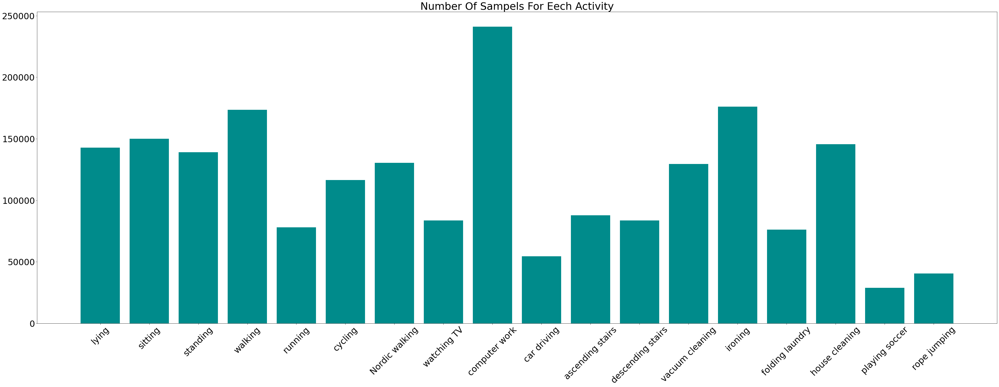

Entropy of the data : 4.01676365095493


In [ ]:
samples_size = Train_Set.groupby('Activity ID').size().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_size['Activity ID']]
activities_size = list(samples_size[0])

bins = range(len(activities_names))
plt.rcParams.update({'font.size': 30})
f, ax = plt.subplots(figsize=(60,20)) 
plt.bar(bins, activities_size, color='darkcyan')
ax.set_xticklabels(activities_names)
ax.set_xticks(np.arange(len(bins)))
ax.set_title("Number Of Sampels For Eech Activity")
plt.xticks(rotation=45)
plt.show()

total = sum(activities_size)
pk_list = [x/total for x in activities_size]

print("Entropy of the data : {}".format(entropy(pk_list, base=2)))

It can be seen from the Entropy value that we get that the data is relatively balanced because the maximum Entropy value we get is a log in base 2 of the number of activities i.e. for 18 activities we will need approximately 4.2 bits to describe the information and as our entropy is higher the distribution of records for each activity is uniform.

But despite this there are a small number of activities we do not have many examples - playing soccer, jumping rope, car driving

### **Sampels For Each Subject**

No handles with labels found to put in legend.


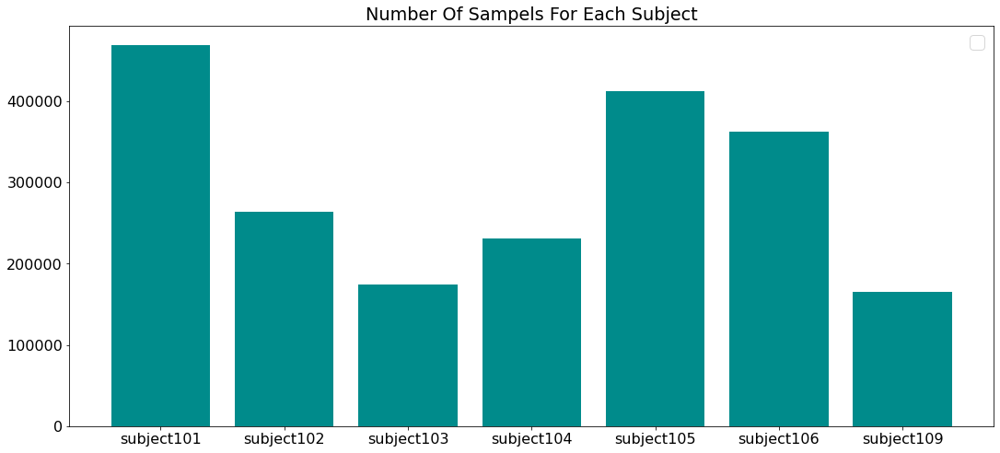

Entropy of the data : 2.7077968319622654


In [ ]:
samples_size = Train_Set.groupby('Name').size().reset_index()
subject_names = samples_size['Name']
subject_size = list(samples_size[0])

bins = range(len(subject_names))
plt.rcParams.update({'font.size': 16})
f, ax = plt.subplots(figsize=(18,8)) 
plt.bar(bins, subject_size, color='darkcyan')
ax.set_xticklabels(subject_names)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(bins)))
ax.set_title("Number Of Sampels For Each Subject")
plt.show()

total = sum(subject_size)
pk_list = [x/total for x in subject_size]

print("Entropy of the data : {}".format(entropy(pk_list, base=2)))

Here, too, it can be seen from the graph and entropy array we obtained that the uncertainty increases and the number of records for each subject is distributed relatively uniformly, so it can be said that the information is balanced - except subject 109 and 103 that we have small amount of samples compering to other subjects.

### **Mean Temperture For Each Subject**

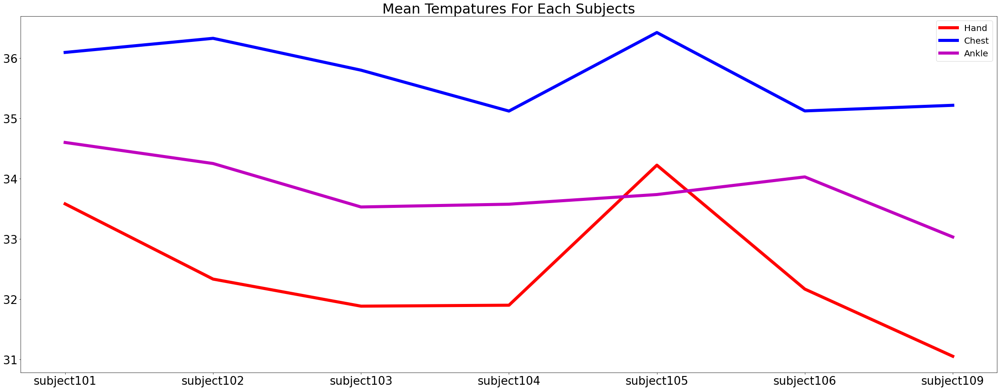

In [ ]:
samples_mean = Train_Set.groupby('Name').mean().reset_index()
subject_names = samples_mean['Name']

mean_df = pd.DataFrame()
mean_df['Hand'] = samples_mean['Hand Temperature']
mean_df['Chest'] = samples_mean['Chest Temperature']
mean_df['Ankle'] = samples_mean['Ankle Temperature']


ax = mean_df.plot(kind='line', figsize=(40,15), title='Mean Tempatures For Each Subjects' , fontsize=26 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(subject_names)
plt.title('Mean Tempatures For Each Subjects' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(subject_names)))
plt.show()

It can be seen that for almost every subject the highest temperature was measured from the sensor which is on the chest in the center of mass, except for subject number 105 which can be seen as a cut in terms of temperature on the hand and ankle.

### **Mean Heart Rate For Each Subject**

No handles with labels found to put in legend.


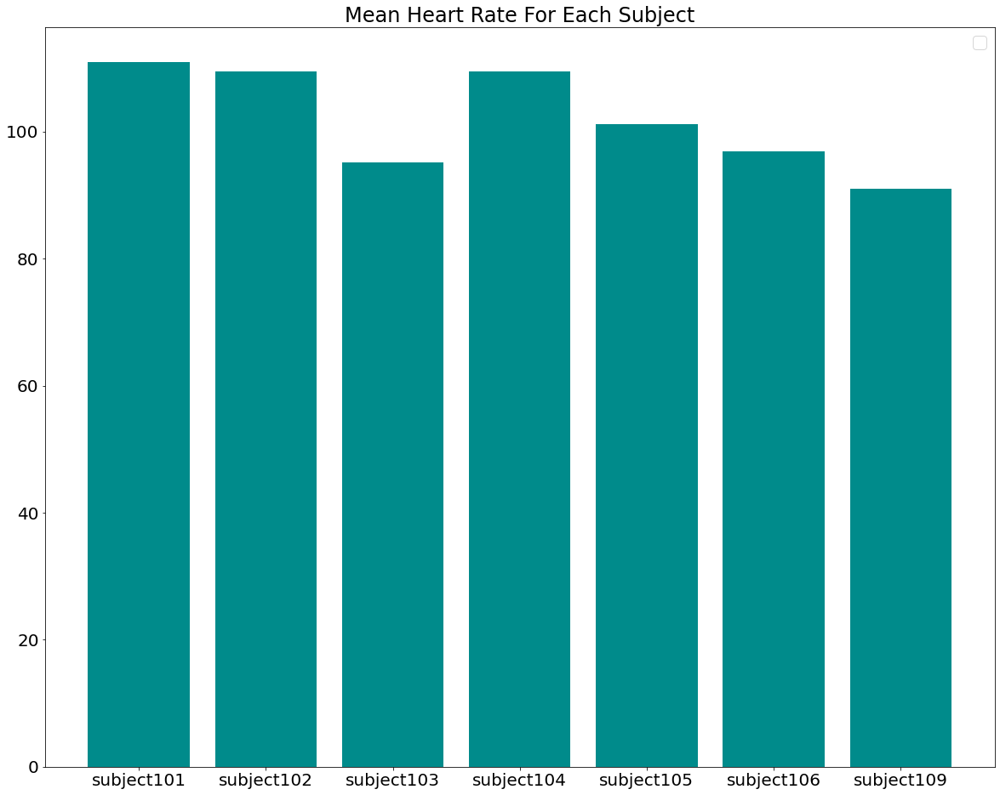

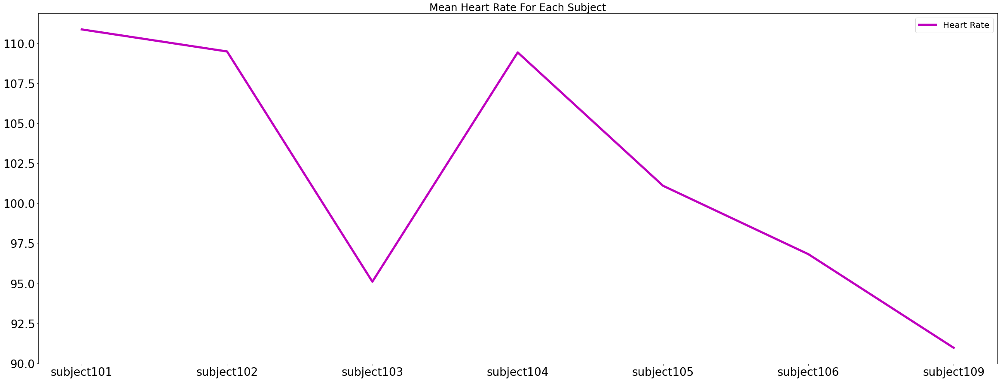

In [ ]:
samples_mean = Train_Set.groupby('Name').mean().reset_index()
subject_names = samples_mean['Name']
subject_mean_heart = samples_mean['Heart Rate']

bins = range(len(subject_names))
plt.rcParams.update({'font.size': 20})
f, ax = plt.subplots(figsize=(20,16)) 
plt.bar(bins, subject_mean_heart, color='darkcyan')
ax.set_xticklabels(subject_names)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(bins)))
ax.set_title("Mean Heart Rate For Each Subject")
plt.show()

ax = subject_mean_heart.plot(kind='line', figsize=(40,15), title='Mean Heart Rate For Each Subject' , fontsize=26 , color='m' , lw=5) 
ax.set_xticklabels(subject_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(subject_names)))
plt.show()


### **Mean Temperture For Each Activity**

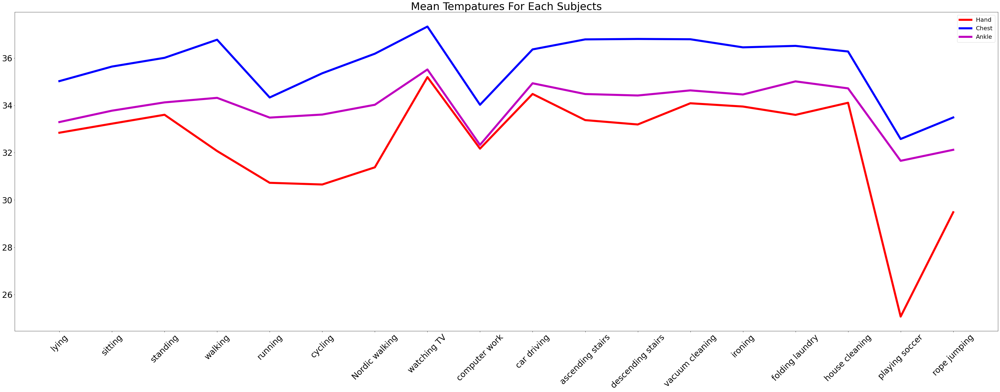

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_df['Hand'] = samples_mean['Hand Temperature']
mean_df['Chest'] = samples_mean['Chest Temperature']
mean_df['Ankle'] = samples_mean['Ankle Temperature']


ax = mean_df.plot(kind='line', figsize=(60,20), title='Mean Tempatures For Each Subjects' , fontsize=28 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Tempatures For Each Subjects' , fontsize=36)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

Here too it can be seen that for all activity the highest temperature measured is from the sensor located in the chest. In addition it is interesting to see that for the three sensors when the activity measured is an activity that combines aerobics - running, cycling, jumping rope etc. the average temperature in this activity decreases while the temperature increases when we perform activities that are not perceived as demanding.

### **Mean Heart Rate For Each Activity**

No handles with labels found to put in legend.


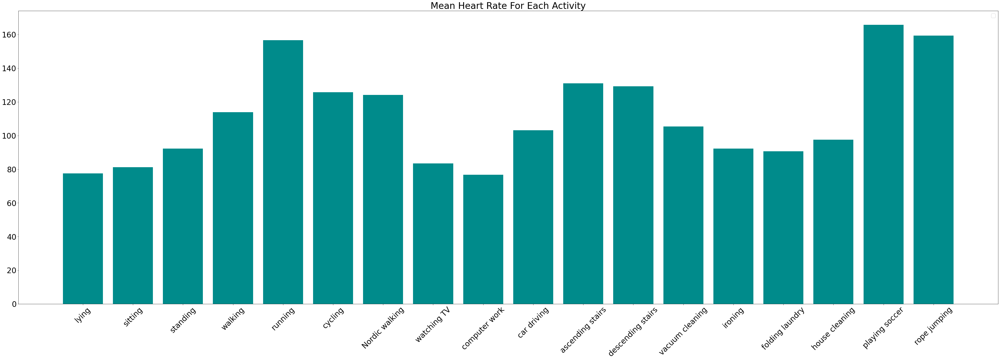

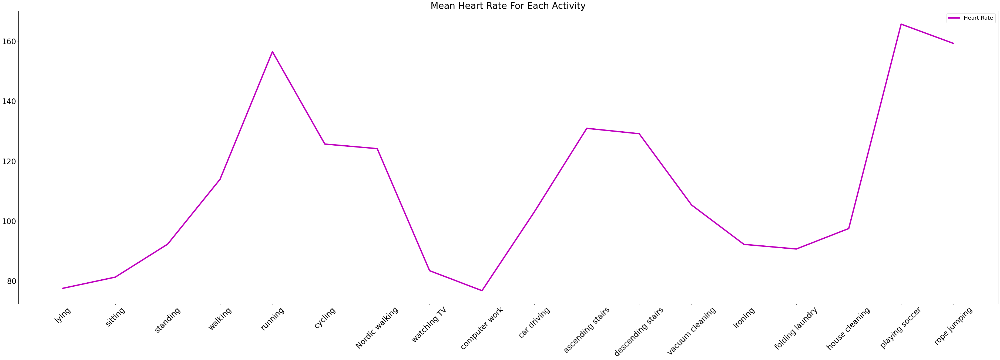

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]
activities_mean_heart = samples_mean['Heart Rate']
bins = range(len(activities_names))
plt.rcParams.update({'font.size': 28})
f, ax = plt.subplots(figsize=(65,20)) 
plt.bar(bins, activities_mean_heart, color='darkcyan')
ax.set_xticklabels(activities_names)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(bins)))
plt.xticks(rotation=45)
ax.set_title("Mean Heart Rate For Each Activity")
plt.show()

ax = activities_mean_heart.plot(kind='line', figsize=(65,20), title='Mean Heart Rate For Each Activity' , fontsize=28 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

Here it can be seen that in terms of heart rate the more aerobic activity is, the higher the heart rate.

### **Corelation Graphs**

Here we will present some graphs that will help us find certain patterns based on relationships between different indices measured, we will mainly present correlations between indices obtained from the chest sensor

In [ ]:
graphs_data = Train_Set.copy()
graphs_data['Activity Name'] = pd.Series(data=[activities_df.loc[x,'Activity'] for x in graphs_data['Activity ID']])

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


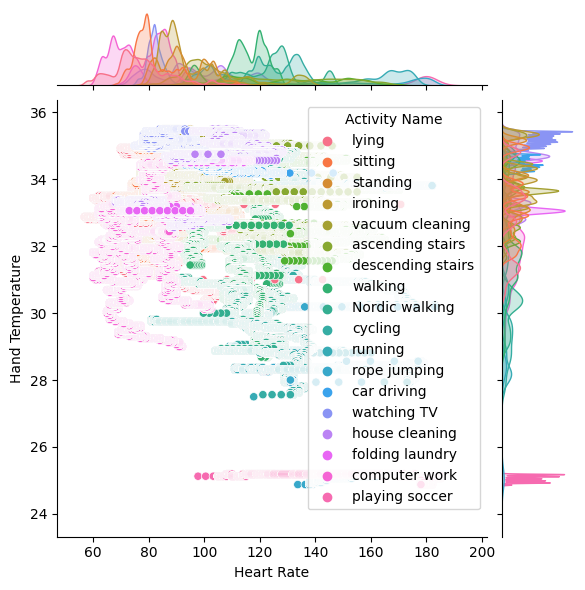

In [ ]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)
sns.jointplot(data=graphs_data, x="Heart Rate", y="Hand Temperature", hue="Activity Name")

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


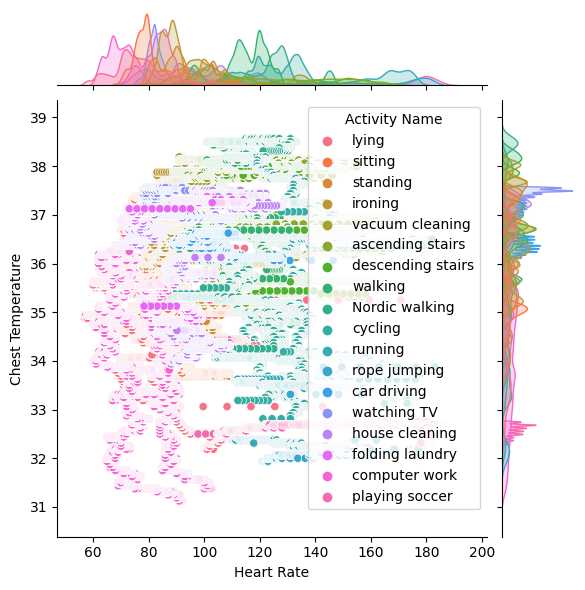

In [ ]:
sns.jointplot(data=graphs_data, x="Heart Rate", y="Chest Temperature", hue="Activity Name")

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


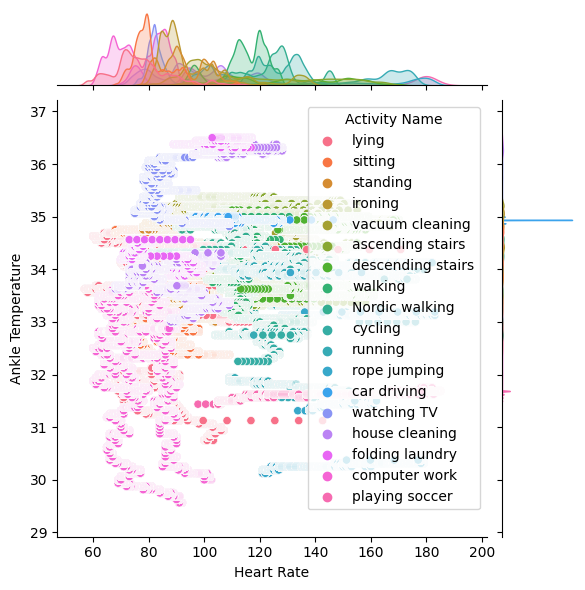

In [ ]:
sns.jointplot(data=graphs_data, x="Heart Rate", y="Ankle Temperature", hue="Activity Name")

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


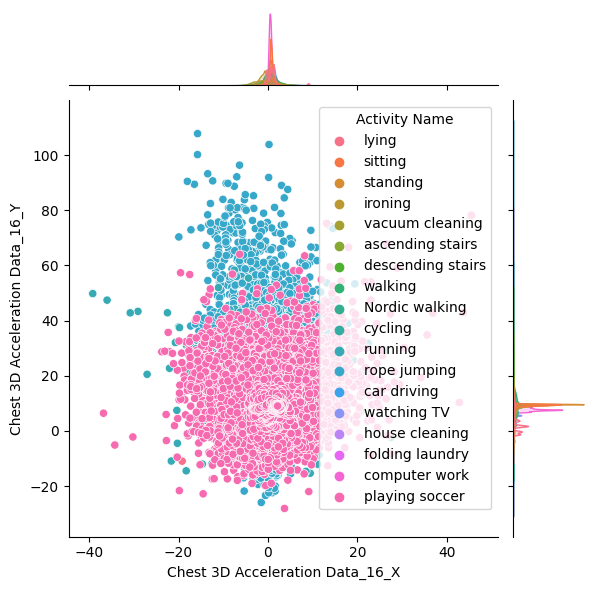

In [ ]:
sns.jointplot(data=graphs_data, x="Chest 3D Acceleration Data_16_X", y="Chest 3D Acceleration Data_16_Y", hue="Activity Name")

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


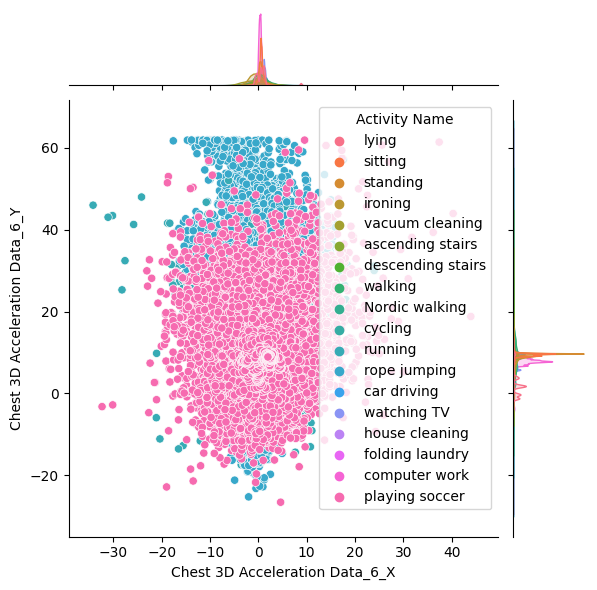

In [ ]:
sns.jointplot(data=graphs_data, x="Chest 3D Acceleration Data_6_X", y="Chest 3D Acceleration Data_6_Y", hue="Activity Name")

In these graphs we can see that in terms of the the acceleration in the center of mass, as we approach values ​​0 and 40 in the corresponding axes we move between 3 main activities - soccer, jumping rope and running - aerobic activities in which we expect a change in acceleration according to mass center

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


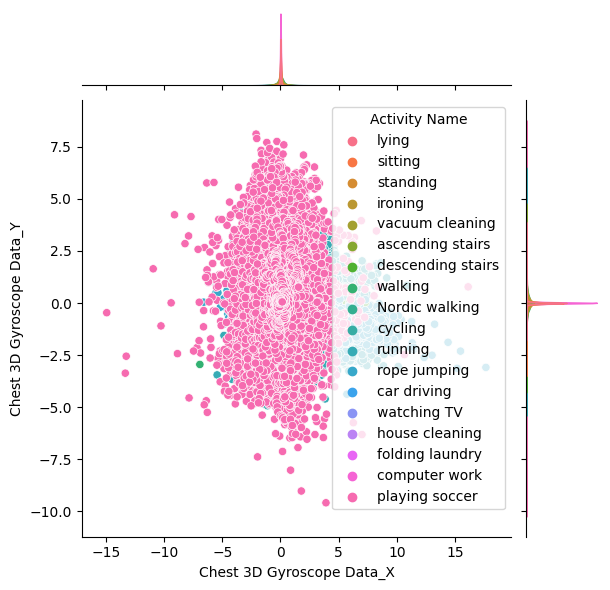

In [ ]:
sns.jointplot(data=graphs_data, x="Chest 3D Gyroscope Data_X", y="Chest 3D Gyroscope Data_Y", hue="Activity Name")

Here too it can be seen that the position of the sensor which is in the center of mass shows that for gyroscope in the center to values ​​0,0 is most often found in aerobic activities that combine movement - for example soccer as can be seen and even jumping rope and running can be seen a small cluster of points - mostly in center values of -2.5-0 in Y and 5 in X.

/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


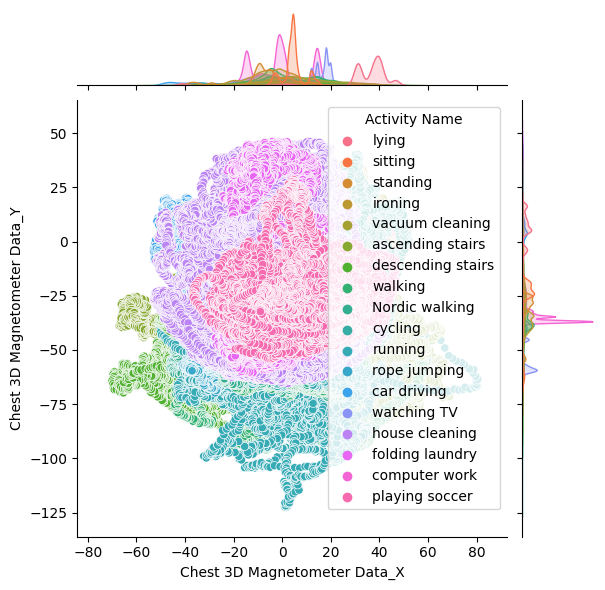

In [ ]:
sns.jointplot(data=graphs_data, x="Chest 3D Magnetometer Data_X", y="Chest 3D Magnetometer Data_Y", hue="Activity Name")

For the magnetometer values ​​located in the center of the mass more significant patterns can be seen

In [ ]:
del graphs_data

### **Mean 3D Acceleration Data For Each IMU**

In the following graphs we can see the behavior of the different vectors for all the IMU sensors of the subjects according to the different activities measured

#### **Hand**

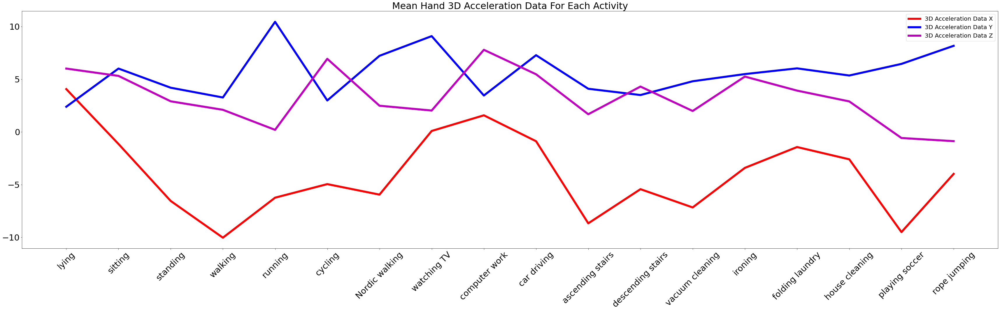

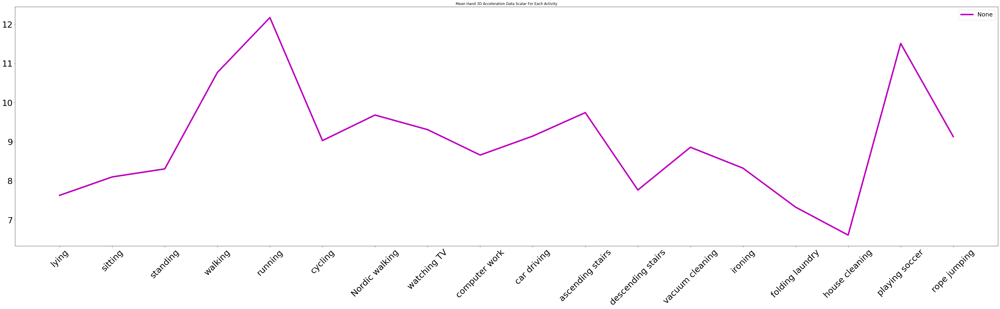

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Hand 3D Acceleration Data_16_X']**2 + 
                                       samples_mean['Hand 3D Acceleration Data_16_Y']**2 + 
                                       samples_mean['Hand 3D Acceleration Data_16_Z']**2 )
mean_df['3D Acceleration Data X'] = samples_mean['Hand 3D Acceleration Data_16_X']
mean_df['3D Acceleration Data Y'] = samples_mean['Hand 3D Acceleration Data_16_Y']
mean_df['3D Acceleration Data Z'] = samples_mean['Hand 3D Acceleration Data_16_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7,
                  color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Hand 3D Acceleration Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15), title='Mean Hand 3D Acceleration Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

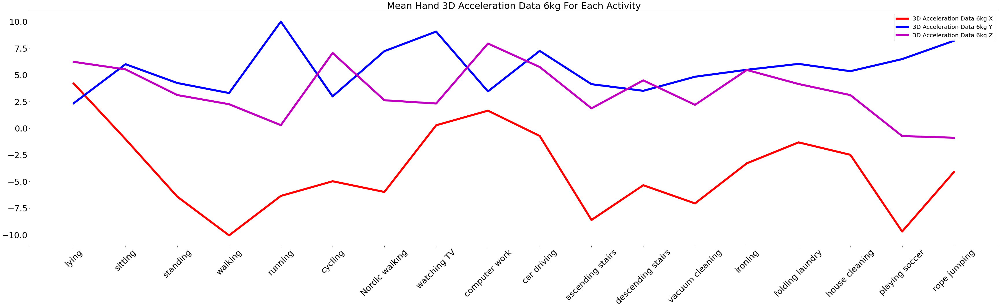

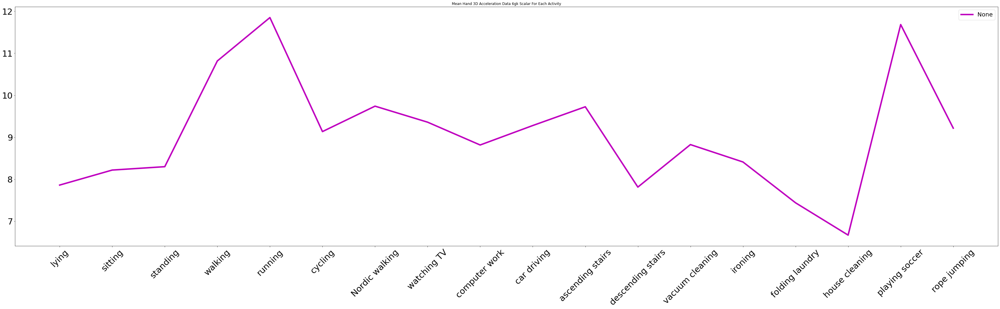

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Hand 3D Acceleration Data_6_X']**2 + 
                                       samples_mean['Hand 3D Acceleration Data_6_Y']**2 + 
                                       samples_mean['Hand 3D Acceleration Data_6_Z']**2 )
mean_df['3D Acceleration Data 6kg X'] = samples_mean['Hand 3D Acceleration Data_6_X']
mean_df['3D Acceleration Data 6kg Y'] = samples_mean['Hand 3D Acceleration Data_6_Y']
mean_df['3D Acceleration Data 6kg Z'] = samples_mean['Hand 3D Acceleration Data_6_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Hand 3D Acceleration Data 6kg For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Hand 3D Acceleration Data 6gk Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

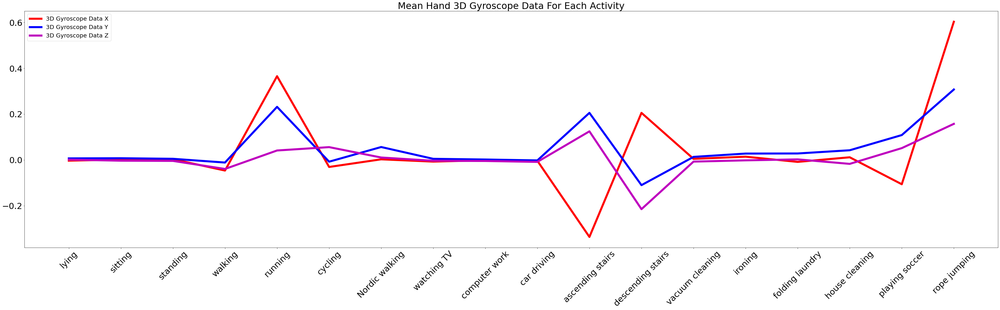

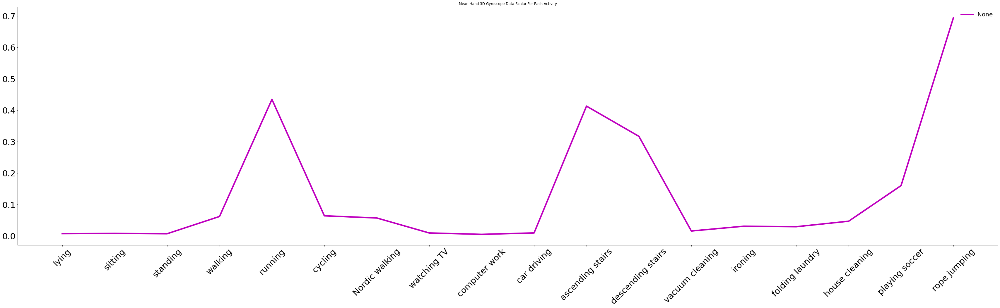

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Hand 3D Gyroscope Data_X']**2 + 
                                       samples_mean['Hand 3D Gyroscope Data_Y']**2 + 
                                       samples_mean['Hand 3D Gyroscope Data_Z']**2 )
mean_df['3D Gyroscope Data X'] = samples_mean['Hand 3D Gyroscope Data_X']
mean_df['3D Gyroscope Data Y'] = samples_mean['Hand 3D Gyroscope Data_Y']
mean_df['3D Gyroscope Data Z'] = samples_mean['Hand 3D Gyroscope Data_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Hand 3D Gyroscope Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Hand 3D Gyroscope Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

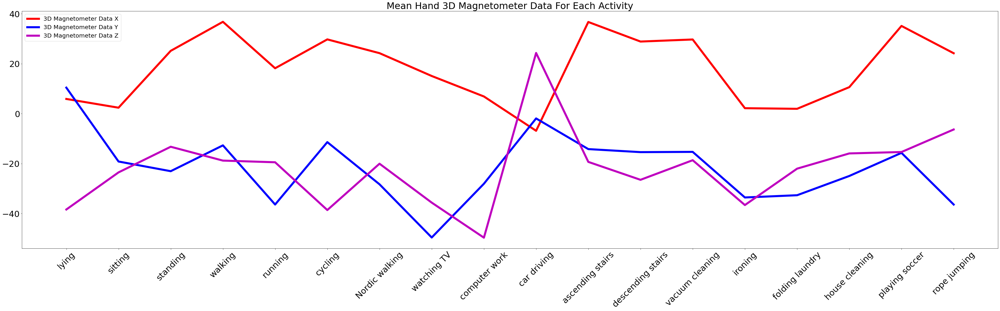

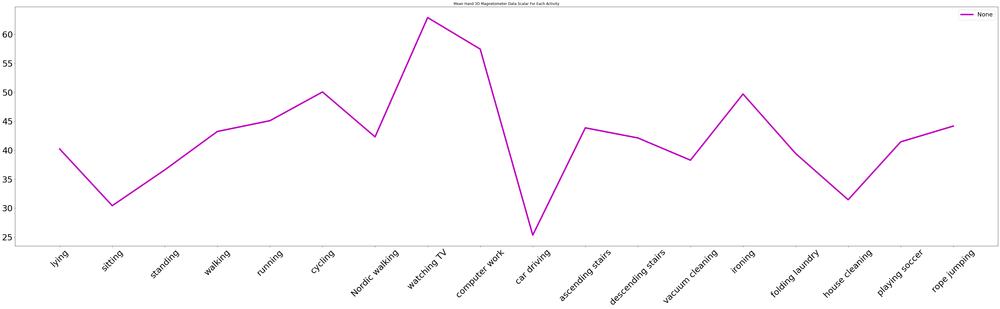

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Hand 3D Magnetometer Data_X']**2 + 
                                       samples_mean['Hand 3D Magnetometer Data_Y']**2 + 
                                       samples_mean['Hand 3D Magnetometer Data_Z']**2 )
mean_df['3D Magnetometer Data X'] = samples_mean['Hand 3D Magnetometer Data_X']
mean_df['3D Magnetometer Data Y'] = samples_mean['Hand 3D Magnetometer Data_Y']
mean_df['3D Magnetometer Data Z'] = samples_mean['Hand 3D Magnetometer Data_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Hand 3D Magnetometer Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Hand 3D Magnetometer Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

#### **Chest**

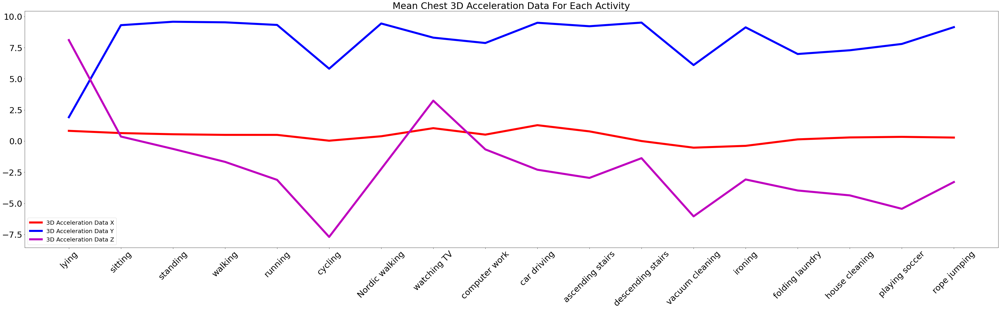

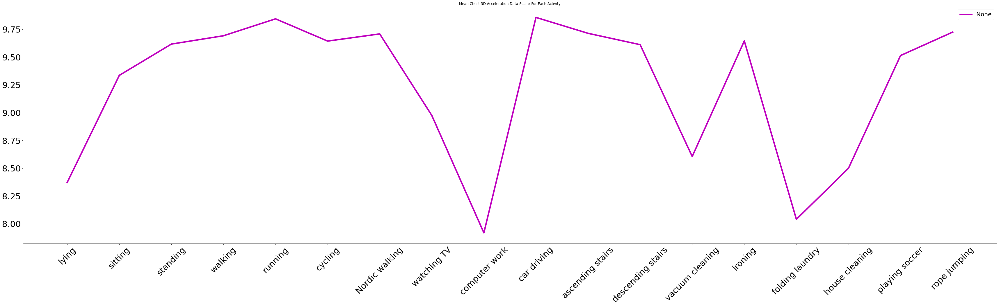

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Chest 3D Acceleration Data_16_X']**2 + 
                                       samples_mean['Chest 3D Acceleration Data_16_Y']**2 + 
                                       samples_mean['Chest 3D Acceleration Data_16_Z']**2 )
mean_df['3D Acceleration Data X'] = samples_mean['Chest 3D Acceleration Data_16_X']
mean_df['3D Acceleration Data Y'] = samples_mean['Chest 3D Acceleration Data_16_Y']
mean_df['3D Acceleration Data Z'] = samples_mean['Chest 3D Acceleration Data_16_Z']


ax = mean_df.plot(kind='line', figsize=(60,15), fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Chest 3D Acceleration Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15), 
                                       title='Mean Chest 3D Acceleration Data Scalar For Each Activity', 
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

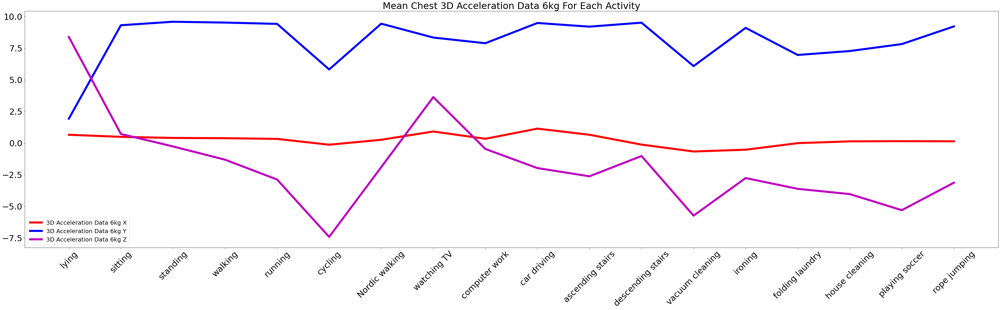

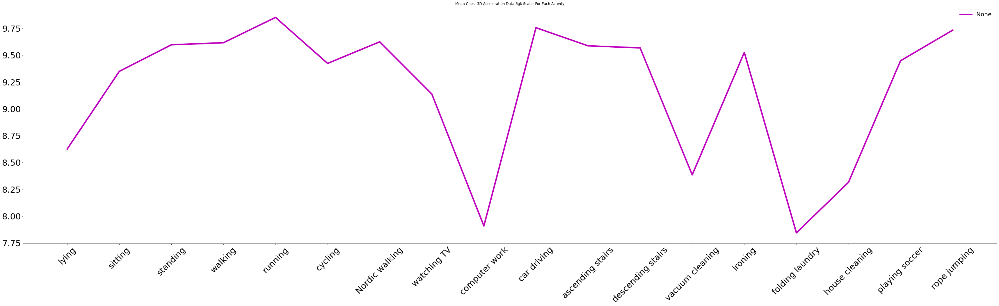

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Chest 3D Acceleration Data_6_X']**2 + 
                                       samples_mean['Chest 3D Acceleration Data_6_Y']**2 + 
                                       samples_mean['Chest 3D Acceleration Data_6_Z']**2 )
mean_df['3D Acceleration Data 6kg X'] = samples_mean['Chest 3D Acceleration Data_6_X']
mean_df['3D Acceleration Data 6kg Y'] = samples_mean['Chest 3D Acceleration Data_6_Y']
mean_df['3D Acceleration Data 6kg Z'] = samples_mean['Chest 3D Acceleration Data_6_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Chest 3D Acceleration Data 6kg For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Chest 3D Acceleration Data 6gk Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

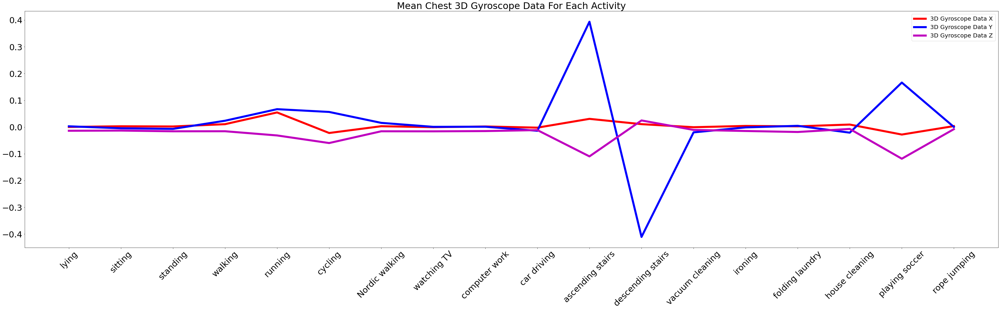

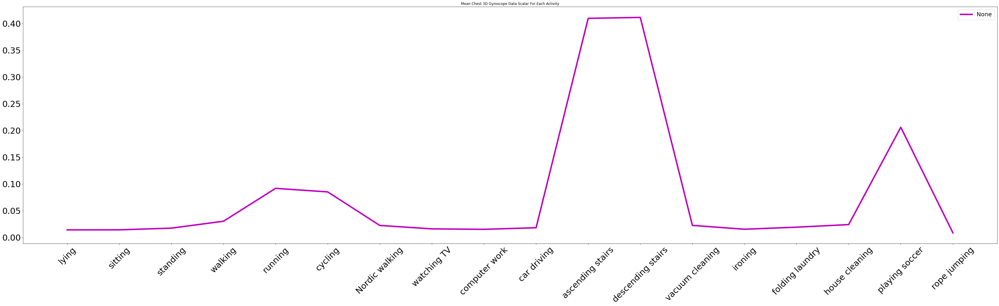

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Chest 3D Gyroscope Data_X']**2 + 
                                       samples_mean['Chest 3D Gyroscope Data_Y']**2 + 
                                       samples_mean['Chest 3D Gyroscope Data_Z']**2 )
mean_df['3D Gyroscope Data X'] = samples_mean['Chest 3D Gyroscope Data_X']
mean_df['3D Gyroscope Data Y'] = samples_mean['Chest 3D Gyroscope Data_Y']
mean_df['3D Gyroscope Data Z'] = samples_mean['Chest 3D Gyroscope Data_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Chest 3D Gyroscope Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Chest 3D Gyroscope Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

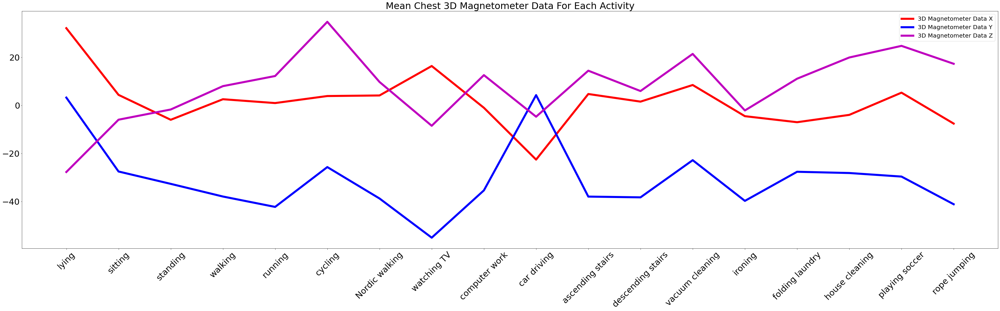

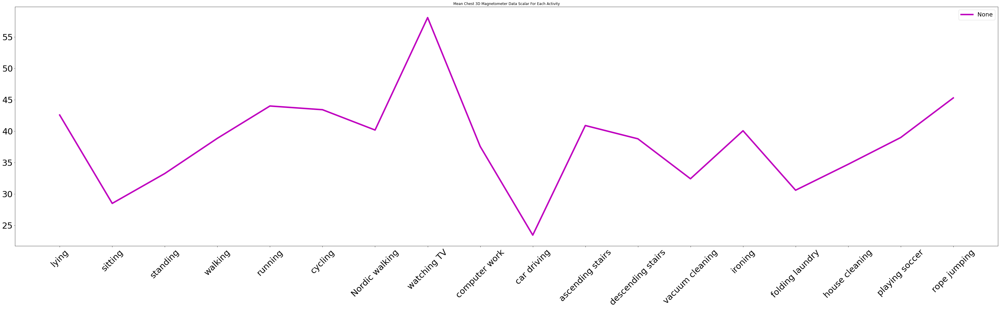

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Chest 3D Magnetometer Data_X']**2 + 
                                       samples_mean['Chest 3D Magnetometer Data_Y']**2 + 
                                       samples_mean['Chest 3D Magnetometer Data_Z']**2 )
mean_df['3D Magnetometer Data X'] = samples_mean['Chest 3D Magnetometer Data_X']
mean_df['3D Magnetometer Data Y'] = samples_mean['Chest 3D Magnetometer Data_Y']
mean_df['3D Magnetometer Data Z'] = samples_mean['Chest 3D Magnetometer Data_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Chest 3D Magnetometer Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Chest 3D Magnetometer Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

#### **Ankle**

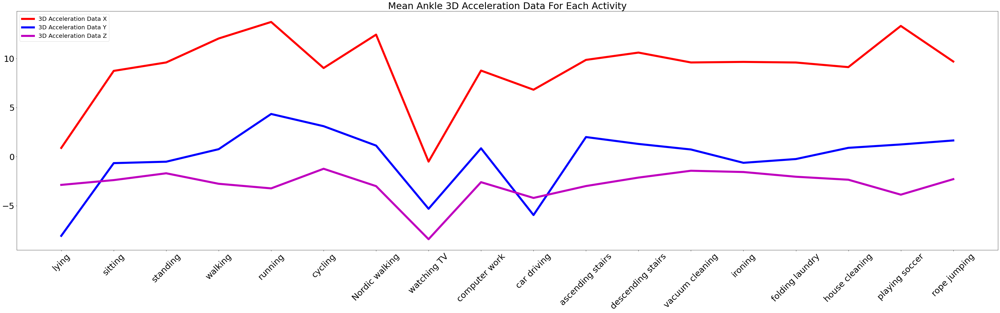

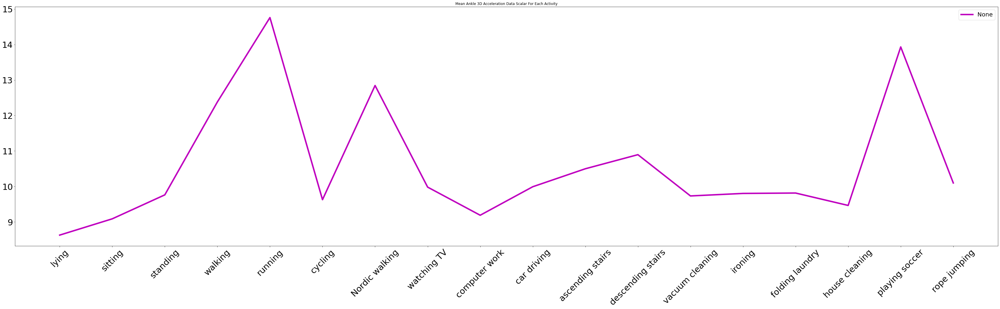

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Ankle 3D Acceleration Data_16_X']**2 + 
                                       samples_mean['Ankle 3D Acceleration Data_16_Y']**2 + 
                                       samples_mean['Ankle 3D Acceleration Data_16_Z']**2 )
mean_df['3D Acceleration Data X'] = samples_mean['Ankle 3D Acceleration Data_16_X']
mean_df['3D Acceleration Data Y'] = samples_mean['Ankle 3D Acceleration Data_16_Y']
mean_df['3D Acceleration Data Z'] = samples_mean['Ankle 3D Acceleration Data_16_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Ankle 3D Acceleration Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Ankle 3D Acceleration Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

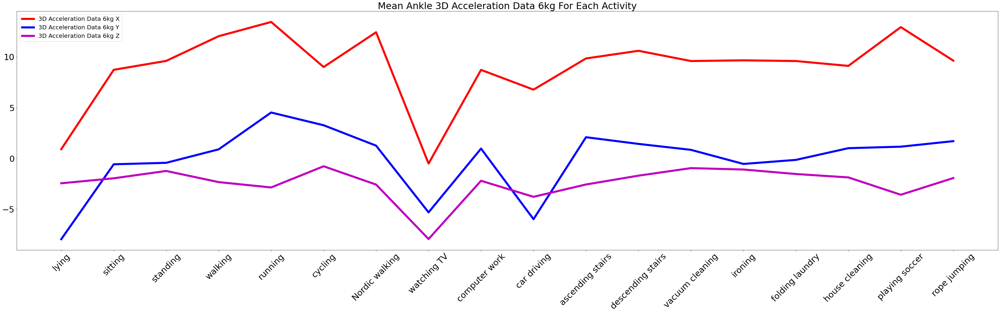

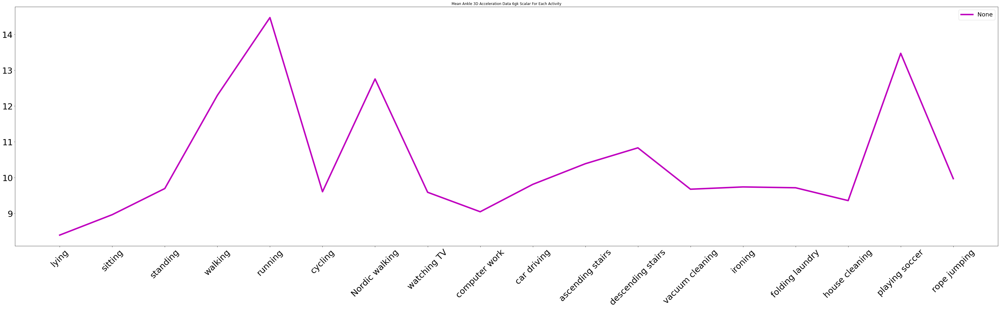

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Ankle 3D Acceleration Data_6_X']**2 + 
                                       samples_mean['Ankle 3D Acceleration Data_6_Y']**2 + 
                                       samples_mean['Ankle 3D Acceleration Data_6_Z']**2 )
mean_df['3D Acceleration Data 6kg X'] = samples_mean['Ankle 3D Acceleration Data_6_X']
mean_df['3D Acceleration Data 6kg Y'] = samples_mean['Ankle 3D Acceleration Data_6_Y']
mean_df['3D Acceleration Data 6kg Z'] = samples_mean['Ankle 3D Acceleration Data_6_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Ankle 3D Acceleration Data 6kg For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Ankle 3D Acceleration Data 6gk Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

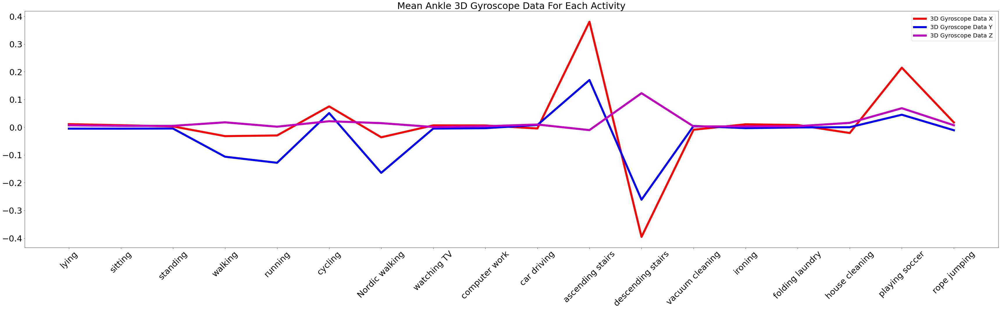

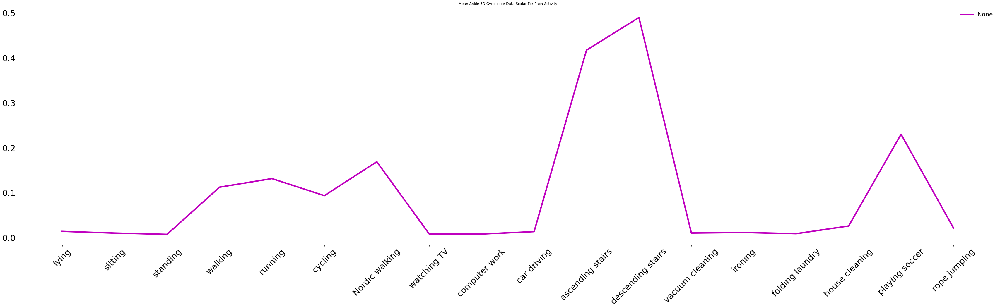

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Ankle 3D Gyroscope Data_X']**2 + 
                                       samples_mean['Ankle 3D Gyroscope Data_Y']**2 + 
                                       samples_mean['Ankle 3D Gyroscope Data_Z']**2 )
mean_df['3D Gyroscope Data X'] = samples_mean['Ankle 3D Gyroscope Data_X']
mean_df['3D Gyroscope Data Y'] = samples_mean['Ankle 3D Gyroscope Data_Y']
mean_df['3D Gyroscope Data Z'] = samples_mean['Ankle 3D Gyroscope Data_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Ankle 3D Gyroscope Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Ankle 3D Gyroscope Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

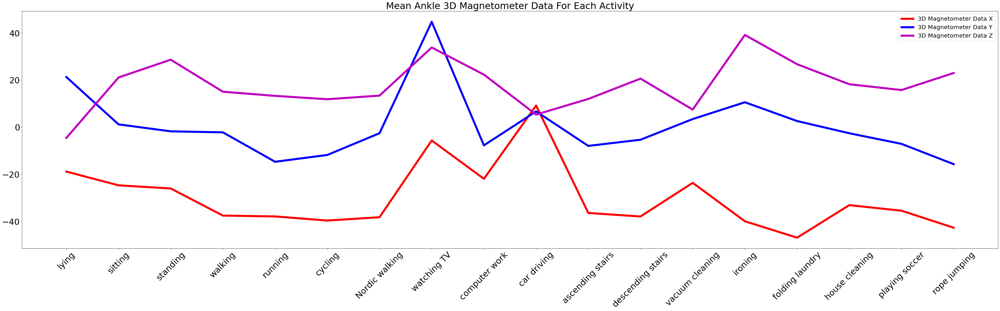

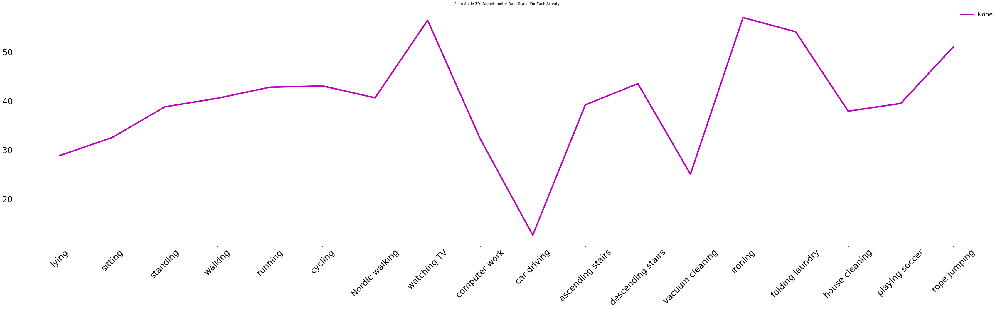

In [ ]:
samples_mean = Train_Set.groupby('Activity ID').mean().reset_index()
activities_names = [activities_df.loc[act_id , 'Activity'] for act_id in samples_mean['Activity ID']]

mean_df = pd.DataFrame()
mean_3D_Acceleration_Data_16 = np.sqrt(samples_mean['Ankle 3D Magnetometer Data_X']**2 + 
                                       samples_mean['Ankle 3D Magnetometer Data_Y']**2 + 
                                       samples_mean['Ankle 3D Magnetometer Data_Z']**2 )
mean_df['3D Magnetometer Data X'] = samples_mean['Ankle 3D Magnetometer Data_X']
mean_df['3D Magnetometer Data Y'] = samples_mean['Ankle 3D Magnetometer Data_Y']
mean_df['3D Magnetometer Data Z'] = samples_mean['Ankle 3D Magnetometer Data_Z']


ax = mean_df.plot(kind='line', figsize=(60,15),fontsize=29 , linewidth=7 ,color=['r','b','m'] ) 
ax.set_xticklabels(activities_names)
plt.title('Mean Ankle 3D Magnetometer Data For Each Activity' , fontsize=32)
ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

ax = mean_3D_Acceleration_Data_16.plot(kind='line', figsize=(60,15),
                                       title='Mean Ankle 3D Magnetometer Data Scalar For Each Activity',
                                       fontsize=29 , color='m' , lw=5) 
ax.set_xticklabels(activities_names)

ax.legend(fontsize = 20)
ax.set_xticks(np.arange(len(activities_names)))
plt.xticks(rotation=45)
plt.show()

## **Self-Supervised Tasks**

As we learned in the lecture, it is difficult to obtain data that already has classifications and labels, and it is also difficult to train a model using an unattended method. In order to have a more effective learning process and start from a better starting point it is possible to perform self-supervision tasks.

a few examples:
* Predict the values ​​of a certain feature given the other features that exist in the data set - for example we want to train our model on some of the data before we classify activities at a given time, with the help of a particular sensor we can try to predict the Heart Rate or particular IMU data and thus produce good initial weights More to the real problem.
* Predict the future with the help of past data - for example try to predict the acceleration for a particular sensor by looking at several points back in time



# **Section 2**

### **Validation and Training strategy**

Our division strategy is to leave a number of subjects in a separate group that will be the validation group - we will test when we leave one subject out according to the leave one out strategy. Any division of the subjects into a validation and training sets will constitute a fold for us.

We will not include subjects 109 in the validation group because subject 109 performs activities that most of the other subjects do not perform and therefore we would like to study him and not perform a test on him.

Also regarding test subject 101 - we would like to study him and not perform tests on him because he encountered activities that only he performed.

For the naive model and the solid model we will perform an average of the different indices for 200 consecutive time points and belong to the same subject for the same activity. That is, we get a new record that contains the average value for each measure.

**Therefore, we will separate the preparation of the information for each task:**

* The first function performs an average over a given time window without overlap.

* The second function prepares data that will fit the LSTM model - we want to insert a matrix in the size of our time window with several fueatures - "Channels", when the time window overlaps but skips 30 points in time to deal with memory utilization and since there are 0.01 seconds difference between one time point and another

* The third function prepares us data for the self-supervised tasks that will fit the LSTM model we will create later.

* The last function perform the split to train data and validation data

In [13]:
def praper_data(df , legs):
    new_df = pd.DataFrame()
    subjects = df['Name'].unique()
    for subject in subjects:
      tmp = df[df.Name == subject]
      for act in Activities_id:
        for sec_inx in [1,2]:
            filter_by_activity = tmp[(tmp['Activity ID'] == act) & (tmp['sec index'] == sec_inx)].copy()
            filter_by_activity.drop(['Time Stamp','Name','sec index','Activity ID'],axis=1,inplace=True)
            if not filter_by_activity.empty:
              filter_by_activity = filter_by_activity.rolling(window=legs).mean()
              filter_by_activity['Name'] = subject
              filter_by_activity['Activity ID'] = act
              filter_by_activity.dropna(inplace=True)
              new_df = new_df.append(filter_by_activity , ignore_index=True)
    return new_df

def praper_data_LSTM(df_data,legs):
    new_data_X = []
    new_data_Y = []
    subjects = df_data['Name'].unique()
    for subject in subjects:  
      tmp = df_data[df_data.Name == subject]
      tmp.drop('Name',axis=1,inplace=True)
      if tmp.empty:
        continue
      for act in Activities_id:
        for sec_inx in [1,2]:
            filter_by_activity = tmp[(tmp['Activity ID'] == act) & (tmp['sec index'] == sec_inx)]
            filter_by_activity.drop(['Time Stamp','sec index','Activity ID'],axis=1,inplace=True)
            if not filter_by_activity.empty:
              for i in range(legs,len(filter_by_activity),30):
                to_append = filter_by_activity.iloc[i-legs:i].values
                new_data_X.append(to_append)
                new_data_Y.append(act)
    return np.array(new_data_X) , np.array(new_data_Y)

def praper_data_LSTM_Pretrain(df_data, features_to_predict,skip, legs):
    train_df_X = pd.DataFrame()
    train_df_Y = pd.DataFrame()
    to_keep = ['Activity ID' , 'Name' , 'sec index'] + features_to_predict
    df_data = df_data[to_keep]
    subjects = df_data['Name'].unique()
    for subject in subjects:  
      tmp = df_data[df_data.Name == subject]
      tmp.drop('Name',axis=1,inplace=True)
      if tmp.empty:
        continue
      for act in Activities_id:
        for sec_inx in [1,2]:
          filter_by_activity = pd.DataFrame()
          filter_by_activity['Target'] = tmp[(tmp['Activity ID'] == act) & (tmp['sec index'] == sec_inx)][features_to_predict[0]].copy()
          if not filter_by_activity.empty:
            for i in range(Legs):
              filter_by_activity['Col_{}'.format(i)] = filter_by_activity['Target'].shift(i+1)
            for i in range(1,2):
              filter_by_activity['Target_{}'.format(i)] = filter_by_activity['Target'].shift(-skip-i)
            filter_by_activity.dropna(inplace=True)
            x = filter_by_activity[['Target_1']].copy()
            train_df_Y = train_df_Y.append(x)
            filter_by_activity.drop(['Target','Target_1'],axis=1,inplace=True)
            train_df_X = train_df_X.append(filter_by_activity)
    return train_df_X , train_df_Y

def split_data(df,to_leave=['subject106']):
  train_df = df[~df['Name'].isin(to_leave)]
  valid_df = df[df['Name'].isin(to_leave)]
  train_Y = pd.DataFrame(train_df['Activity ID']).astype(int)
  validation_Y = pd.DataFrame(valid_df['Activity ID']).astype(int)
  train_df.drop(['Activity ID','Name'] , axis=1 , inplace=True)
  valid_df.drop(['Activity ID','Name'] , axis=1 , inplace=True)
  return train_df , train_Y , valid_df , validation_Y
    

In [ ]:
Subjects = ['subject101','subject102','subject103','subject104','subject105','subject106','subject109']

In [ ]:
Train_Set = praper_data(Train_Set,200)
Train_Set.shape

(2061962, 42)

## **Naive Base Line**

Our naive model will determine according to the rule a decision regarding the Heart Rate during a particular activity. As we showed in the graphs for each activity measured we got a value for the average Heart Rate in each activity. We will use these values ​​as threshold values ​​to test for a given time segment with an average Heart Rate - for which activity we are expected to receive.
We will create a bin for each activity and apply the validation group to the bins we received and in this way we will classify which activity each subject performed within a certain time frame - 2 sec.

### **Train**

In [ ]:
tmp = []
for subject in Subjects:
    train_X , train_Y , validation_X , validation_Y = split_data(Train_Set,to_leave=[subject])
    to_train = train_X.copy()
    to_train['Activity ID'] = train_Y
    df_mean = to_train.groupby('Activity ID').mean().reset_index()
    activities_ids = list(df_mean['Activity ID'])
    activities_mean_heart_rate = [int(x) for x in df_mean['Heart Rate']]

    activities_heart_rate_dict = dict(zip(activities_ids, activities_mean_heart_rate))
    activities_heart_rate_dict = dict(sorted(activities_heart_rate_dict.items(), key=lambda item: item[1]))

    bins = np.array(list(activities_heart_rate_dict.values()))

    values = list(validation_X['Heart Rate'])
    placings = np.digitize(values, bins)

    activities_ids = list(activities_heart_rate_dict.keys())
    predict_activity = []
    for b in placings:
        activity_id = activities_ids[b-1]
        predict_activity.append(activity_id)

    size = len(validation_Y)
    matches = 0
    for i in range(size):
        if predict_activity[i] == validation_Y.iloc[i,0]:
            matches += 1

    validation_accuracy = matches / size
    tmp.append([subject , validation_X.shape , train_X.shape , '{}%'.format(round(validation_accuracy*100,5)) ])

results = pd.DataFrame(data=tmp,columns=['Validation Group' , 'Validation Size' , 'Train Size' , 'Validation Accuracy'])
results


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,Validation Group,Validation Size,Train Size,Validation Accuracy
0,subject101,"(466141, 40)","(1595821, 40)",8.37644%
1,subject102,"(260961, 40)","(1801001, 40)",15.27048%
2,subject103,"(172746, 40)","(1889216, 40)",19.41058%
3,subject104,"(229430, 40)","(1832532, 40)",16.10775%
4,subject105,"(409027, 40)","(1652935, 40)",7.17801%
5,subject106,"(359388, 40)","(1702574, 40)",7.03947%
6,subject109,"(164269, 40)","(1897693, 40)",0.1461%


### **Test**

In [ ]:
values = list(Test_Set['Heart Rate'])
Y = list(Test_Set['Activity ID'])
placings = np.digitize(values, bins)

activities_ids = list(activities_heart_rate_dict.keys())
predict_activity = []
for b in placings:
    activity_id = activities_ids[b-1]
    predict_activity.append(activity_id)

size = len(Y)
matches = 0
for i in range(size):
    if predict_activity[i] == Y[i]:
        matches += 1

test_accuracy = matches / size
print("Test Accuracy : {}%".format(round(test_accuracy*100,5)))

Test Accuracy : 13.38498%


## **Solid Benchmark**

As a model that will give us more solid values ​​we will use a model of linear regression

### **Train**

In [ ]:
tmp = []
matrixs = []
for subject in Subjects:
    train_X , train_Y , validation_X , validation_Y = split_data(Train_Set,to_leave=[subject])
    reg = LogisticRegression(n_jobs=8,solver='lbfgs',multi_class='auto')
    reg.fit(train_X, train_Y['Activity ID'])
    preds = reg.predict(validation_X)
    matrixs.append([validation_Y,preds])
    tmp.append([subject , validation_X.shape , train_X.shape , '{}%'.format(round(accuracy_score(validation_Y,preds)*100,5)) ])

results = pd.DataFrame(data=tmp,columns=['Validation Group' , 'Validation Size' , 'Train Size' , 'Validation Accuracy'])
results



,Validation Group,Validation Size,Train Size,Validation Accuracy
0,subject101,"(466141, 40)","(1595821, 40)",23.89642%
1,subject102,"(260961, 40)","(1801001, 40)",55.5926%
2,subject103,"(172746, 40)","(1889216, 40)",80.37002%
3,subject104,"(229430, 40)","(1832532, 40)",67.97542%
4,subject105,"(409027, 40)","(1652935, 40)",41.59994%
5,subject106,"(359388, 40)","(1702574, 40)",55.656%
6,subject109,"(164269, 40)","(1897693, 40)",3.34999%


In [ ]:
activities_df.set_index('ID',inplace=True)

Prediction vs True Labels for subject 103 as validation group

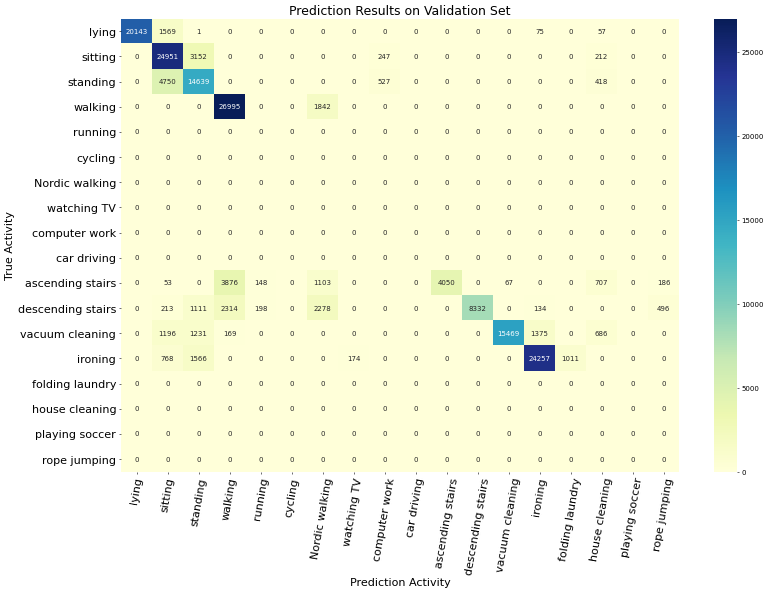

In [ ]:
true_y = list(matrixs[2][0]['Activity ID'])
preds_y = matrixs[2][1]
labels = list(Activities_id)
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
#sns.set(font_scale=2.0)
sns.heatmap(confusion_matrix(true_y,preds_y,labels), ax=ax ,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Validation Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16) 
labels = [activities_df.loc[x,'Activity'] for x in labels]
ax.set_xticklabels(labels)
ax.set_yticklabels(labels)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

### **Test**

We found that the distribution that gave us the best results was when subject 103 was in the validation group so we were again loyal to a regression model with the help of the training group that did not include subject 103

In [ ]:
test_set_to_predict = Test_Set.copy()
test_set_to_predict.drop('Name',axis=1,inplace=True)
Y = list(Test_Set['Activity ID'])
test_set_to_predict.drop('Activity ID',axis=1,inplace=True)
train_X , train_Y , validation_X , validation_Y = split_data(Train_Set,to_leave=['subject103'])
reg2 = LogisticRegression(n_jobs=8,solver='lbfgs',multi_class='auto')
reg2.fit(train_X, train_Y['Activity ID'])


In [ ]:
test_set_to_predict.drop(['Time Stamp','sec index'],axis=1,inplace=True)
preds = reg2.predict(test_set_to_predict)
print('Logistic regression accuracy on Test Set: {}%'.format(round(accuracy_score(Y,preds)*100,5)))

Logistic regression accuracy on Test Set: 37.27634%


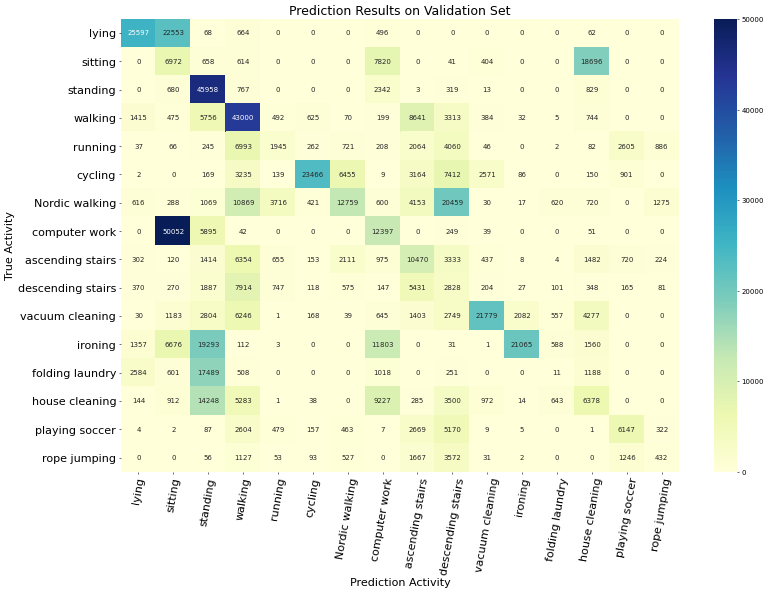

In [ ]:
labels = np.unique(np.array(Y))
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
#sns.set(font_scale=2.0)
sns.heatmap(confusion_matrix(Y,preds,labels) , ax=ax ,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Validation Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16)
labels = [activities_df.loc[x,'Activity'] for x in labels] 
ax.set_xticklabels(labels)
ax.set_yticklabels(labels)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

## **NN Model - LSTM**

In this part we will create an LSTM model - the input for this model will be a matrix that we will create for 200 points in time - 2 seconds, when we make a jump of 30 points in time - 0.3 seconds, and at each point in time we will insert 40 different features - input channels.

### **Train**


In [14]:
Train_Set_LSTM = load_data(Train_csv_dir , Train_csv_Opt_dir , opt=True)
Train_Set_LSTM.columns = Col_Names + ['Name'] 
Train_Set_LSTM.drop('index',axis=1,inplace=True) 
Train_Set_LSTM.head()
Train_Set_LSTM = remove_columns(Train_Set_LSTM, oriantation=True)
Train_Set_LSTM = pre_process_data_LSTM(Train_Set_LSTM)

In [15]:
Train_Set_LSTM.shape

(2077883, 44)

In [16]:
def LSTM_Model(Legs,Features,Classes):
  inp = Input(shape=(Legs,Features))
  x = LSTM(6)(inp)
  x = Dense(64,activation='relu')(x)
  x = Dropout(0.4)(x)
  x = Dense(32,activation='relu')(x)
  x = Dropout(0.7)(x)
  if Classes == 1:
    x = Dense(Classes,activation='relu')(x)
    model = Model(inp,x)
    model.compile(loss='mse',optimizer='adam')
    return model
  else:
    x = Dense(Classes,activation='softmax')(x)
    model = Model(inp,x)
    model.compile(loss='mse',optimizer='adam',metrics=['accuracy'])
    return model



In [17]:
def plot_history(history):
  fig, ax = plt.subplots(1,2,figsize=(16,6))
  ax[0].plot(history.history['accuracy'], color='red')
  ax[0].plot(history.history['val_accuracy'], color='green')
  ax[0].set_title('Model accuracy')
  ax[0].set_ylabel('Accuracy')
  ax[0].set_xlabel('Epoch')
  ax[0].legend(['Train', 'Validation'], loc='upper left')

  ax[1].plot(history.history['loss'], color='red')
  ax[1].plot(history.history['val_loss'], color='green')
  ax[1].set_title('Model loss')
  ax[1].set_ylabel('Loss')
  ax[1].set_xlabel('Epoch')
  ax[1].legend(['Train', 'Validation'], loc='upper left')
  plt.show()

In [18]:
Legs=200
Features=40
Classes=len(Activities)
model = LSTM_Model(Legs,Features,Classes)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm (LSTM)                  (None, 6)                 1128      
_________________________________________________________________
dense (Dense)                (None, 64)                448       
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 18)                594   

###################################################################
LSTM Model:
Validation Group: subject102
Train Set Size : (60067, 200, 40)
Validation Set Size : (8704, 200, 40)
Train Classes Size : (60067, 18)
Validation Classes Size : (8704, 18)
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm (LSTM)                  (None, 6)                 1128      
_________________________________________________________________
dense (Dense)                (None, 64)                448       
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
________

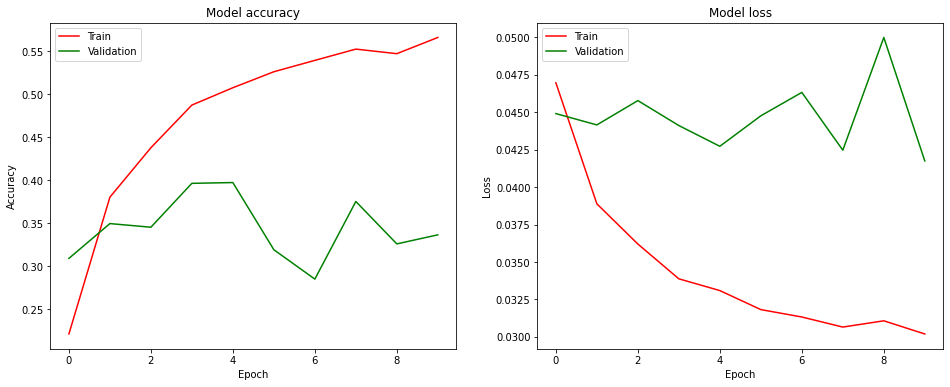

272/272 [==============================] - 1s 5ms/step - loss: 0.0417 - accuracy: 0.3364
###################################################################
LSTM Model:
Validation Group: subject103
Train Set Size : (63009, 200, 40)
Validation Set Size : (5762, 200, 40)
Train Classes Size : (63009, 18)
Validation Classes Size : (5762, 18)
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 6)                 1128      
_________________________________________________________________
dense_3 (Dense)              (None, 64)                448       
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________

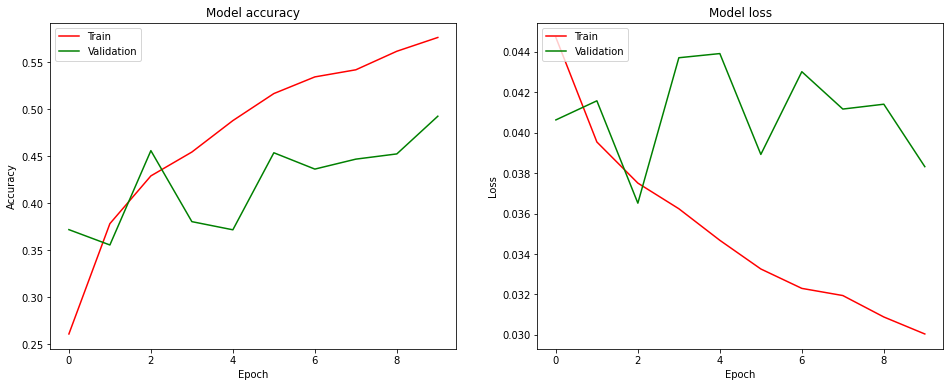

181/181 [==============================] - 1s 6ms/step - loss: 0.0383 - accuracy: 0.4927
###################################################################
LSTM Model:
Validation Group: subject104
Train Set Size : (61119, 200, 40)
Validation Set Size : (7652, 200, 40)
Train Classes Size : (61119, 18)
Validation Classes Size : (7652, 18)
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 6)                 1128      
_________________________________________________________________
dense_6 (Dense)              (None, 64)                448       
_________________________________________________________________
dropout_4 (Dropout)          (None, 64)                0         
_________________________________________________

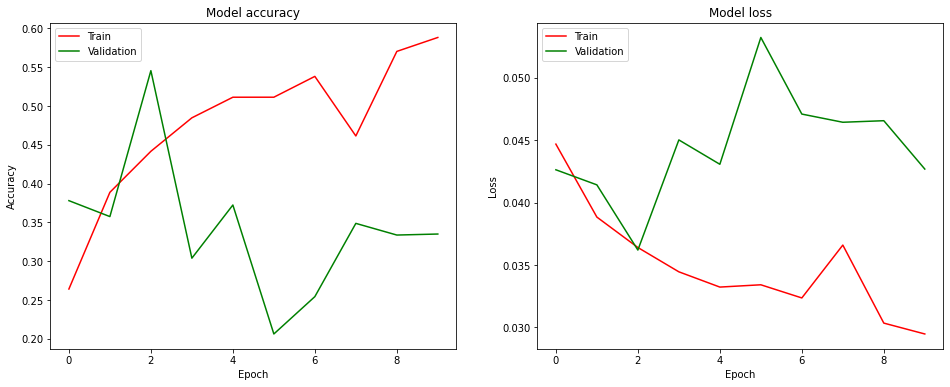

240/240 [==============================] - 1s 6ms/step - loss: 0.0427 - accuracy: 0.3351
###################################################################
LSTM Model:
Validation Group: subject105
Train Set Size : (55129, 200, 40)
Validation Set Size : (13642, 200, 40)
Train Classes Size : (55129, 18)
Validation Classes Size : (13642, 18)
Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm_3 (LSTM)                (None, 6)                 1128      
_________________________________________________________________
dense_9 (Dense)              (None, 64)                448       
_________________________________________________________________
dropout_6 (Dropout)          (None, 64)                0         
_______________________________________________

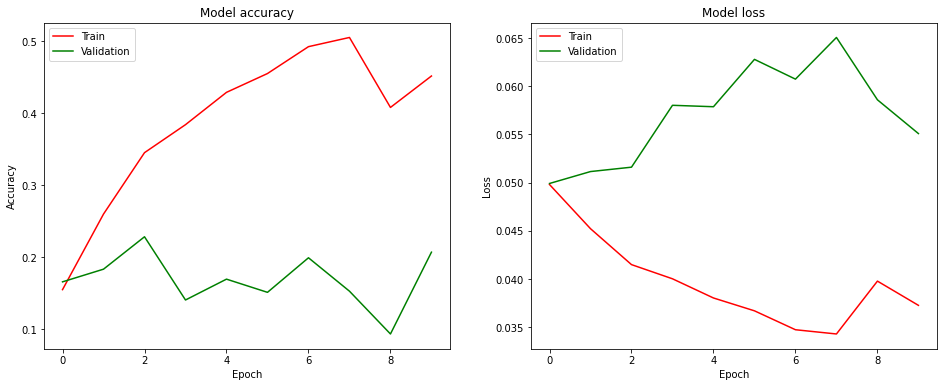

427/427 [==============================] - 2s 6ms/step - loss: 0.0551 - accuracy: 0.2069
###################################################################
LSTM Model:
Validation Group: subject106
Train Set Size : (56784, 200, 40)
Validation Set Size : (11987, 200, 40)
Train Classes Size : (56784, 18)
Validation Classes Size : (11987, 18)
Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 6)                 1128      
_________________________________________________________________
dense_12 (Dense)             (None, 64)                448       
_________________________________________________________________
dropout_8 (Dropout)          (None, 64)                0         
_______________________________________________

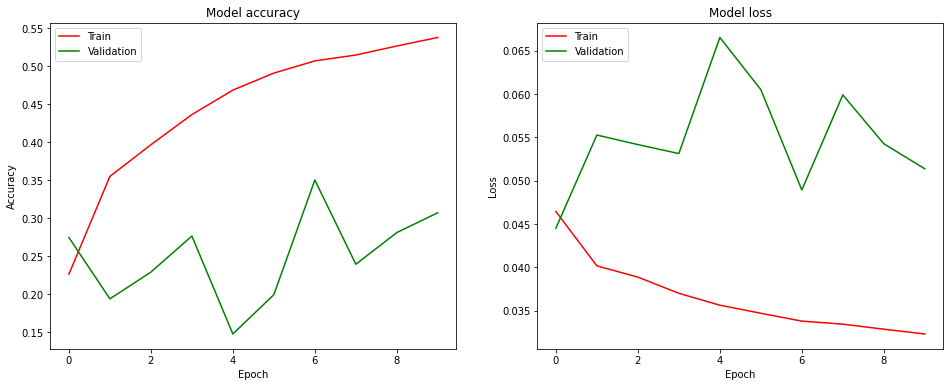

375/375 [==============================] - 2s 5ms/step - loss: 0.0514 - accuracy: 0.3074


In [ ]:
from sklearn.preprocessing import OneHotEncoder
VALIDATION_ACCURACY = []
VALIDAITON_LOSS = []

for subject in ['subject102','subject103','subject104','subject105','subject106']:
  validation_group = [subject]
  train_df = Train_Set_LSTM[~Train_Set_LSTM['Name'].isin(validation_group)].copy()
  valid_df = Train_Set_LSTM[Train_Set_LSTM['Name'].isin(validation_group)].copy() 
  train_lstm_x , train_lstm_y = praper_data_LSTM(train_df,Legs)
  validation_lstm_x , validation_lstm_y = praper_data_LSTM(valid_df,Legs)
  encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
  encoder.fit(train_lstm_y.reshape(-1, 1))
  train_lstm_y = encoder.transform(train_lstm_y.reshape(-1, 1))
  validation_lstm_y = encoder.transform(validation_lstm_y.reshape(-1, 1))
  print('###################################################################')
  print("LSTM Model:")
  print("Validation Group: {}".format(subject))
  print("Train Set Size : {}".format(train_lstm_x.shape))
  print("Validation Set Size : {}".format(validation_lstm_x.shape))
  print("Train Classes Size : {}".format(train_lstm_y.shape))
  print("Validation Classes Size : {}".format(validation_lstm_y.shape))
  cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_{}.h5'.format(subject)),
                        monitor='val_accuracy',
                        verbose=1,
                        save_best_only=True,
                        mode='max')
  model = LSTM_Model(Legs,Features,Classes)
  history = model.fit(train_lstm_x,train_lstm_y,validation_data=(validation_lstm_x,validation_lstm_y),epochs=10,callbacks=[cp])
  plot_history(history)
  results = model.evaluate(x=validation_lstm_x,y=validation_lstm_y)
  results = dict(zip(model.metrics_names,results))
  VALIDATION_ACCURACY.append(results['accuracy'])
  VALIDAITON_LOSS.append(results['loss'])


In [32]:
VALIDATION_ACCURACY=[0.3363, 0.4927, 0.335, 0.2069, 0.3074]
VALIDAITON_LOSS=[0.0417, 0.0383, 0.0426, 0.055, 0.0513]
print("Validation Accuracy : \n['subject102','subject103','subject104','subject105','subject106']\n{}".format(VALIDATION_ACCURACY))
print("Validation Loss : \n['subject102','subject103','subject104','subject105','subject106']\n{}".format(VALIDAITON_LOSS))


Validation Accuracy : 
['subject102','subject103','subject104','subject105','subject106']
[0.3363, 0.4927, 0.335, 0.2069, 0.3074]
Validation Loss : 
['subject102','subject103','subject104','subject105','subject106']
[0.0417, 0.0383, 0.0426, 0.055, 0.0513]


In [55]:
arrays = [['Base LSTM Model','Base LSTM Model'],['Loss', 'Accuracy']]
tuples = list(zip(*arrays))
index = pd.MultiIndex.from_tuples(tuples)
list_ = []
for i in range(5):
  list_.append([VALIDAITON_LOSS[i],VALIDATION_ACCURACY[i]])
df = pd.DataFrame(list_, index=['Subject102', 'Subject103', 'Subject104' , 'Subject105' , 'Subject106'], columns=index)

In [56]:
df

Base LSTM Model         
                      Loss Accuracy
Subject102          0.0417   0.3363
Subject103          0.0383   0.4927
Subject104          0.0426   0.3350
Subject105          0.0550   0.2069
Subject106          0.0513   0.3074

**We can see that we have some overfitting and also extreme jumps in values of Loss and Accuracy on the Validation Set**

### **Test**


In [22]:
Test_Set_LSTM = load_data(Test_csv_dir , Test_csv_Opt_dir , opt=True)
Test_Set_LSTM.columns = Col_Names + ['Name'] 
Test_Set_LSTM.drop('index',axis=1,inplace=True) 
Test_Set_LSTM.head()
Test_Set_LSTM = remove_columns(Test_Set_LSTM, oriantation=True)
Test_Set_LSTM = pre_process_data_LSTM(Test_Set_LSTM)

In [23]:
Test_Set_LSTM.shape

(647070, 44)

In [ ]:
Legs=200
test_lstm_x , test_lstm_y = praper_data_LSTM(Test_Set_LSTM,Legs)

In [59]:
model = LSTM_Model(200,40,18)
model.load_weights('/content/drive/MyDrive/DL_Ass2/LSTM_Model_subject103.h5')
predictions = model.predict(test_lstm_x)
preds_classes = np.argmax(predictions,axis=1)
predict = np.unique(preds_classes).tolist() 
true = np.unique(Activities_id).tolist() 
class_map = list(zip(predict,true))
class_map = dict(class_map)
results = [class_map[x] for x in preds_classes]
print('LSTM Model Accuracy On Test Set : {}%'.format(round(accuracy_score(test_lstm_y,results)*100,5)))

LSTM Model Accuracy On Test Set : 27.20307%


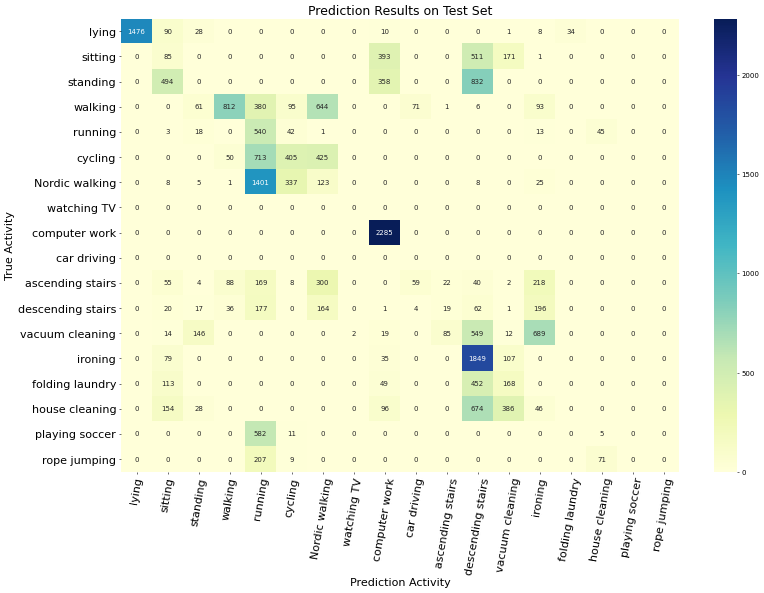

In [60]:
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
sns.heatmap(confusion_matrix(test_lstm_y,results,true),ax=ax,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Test Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16) 
true_new = [activities_df.loc[x,'Activity'] for x in true]
ax.set_xticklabels(true_new)
ax.set_yticklabels(true_new)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

In [61]:
model = LSTM_Model(200,40,18)
model.load_weights('/content/drive/MyDrive/DL_Ass2/LSTM_Model_subject104.h5')
predictions = model.predict(test_lstm_x)
preds_classes = np.argmax(predictions,axis=1)
predict = np.unique(preds_classes).tolist() 
true = np.unique(Activities_id).tolist() 
class_map = list(zip(predict,true))
class_map = dict(class_map)
results = [class_map[x] for x in preds_classes]
print('LSTM Model Accuracy On Test Set : {}%'.format(round(accuracy_score(test_lstm_y,results)*100,5)))

LSTM Model Accuracy On Test Set : 33.83796%


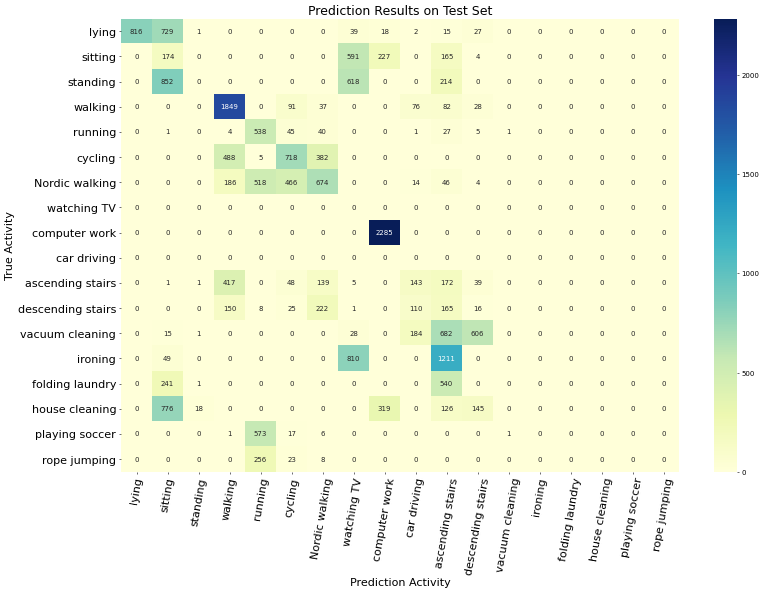

In [62]:
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
sns.heatmap(confusion_matrix(test_lstm_y,results,true),ax=ax,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Test Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16) 
true_new = [activities_df.loc[x,'Activity'] for x in true]
ax.set_xticklabels(true_new)
ax.set_yticklabels(true_new)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

**It can be seen that subject 103 gave us the best performance when we used it as a validation group but higher accuracy on the test we got for the model we train when subject 104 was used as a validation group - 33.83796%**

**To summarize this section it can be seen that we obtained an accuracy on the test set lower than the linear regression model and also in the training process our accuracy is lower than the performance of the regression model we trained**

## **Pretrain our NN Model**

As we described the tasks in question 1 we will try to perform the first task we suggested - pre-training the model on the problem of predicting a particular feature based on using the features we have so that we can get good starting weights and improve our model.

We will try to make a prediction for the temperature measured in the subject's hand at any given time based on the other features given to us using the same model we built in the previous section

In [ ]:
Train_Set_Pretrain = load_data(Train_csv_dir , Train_csv_Opt_dir , opt=True)
Train_Set_Pretrain.columns = Col_Names + ['Name'] 
Train_Set_Pretrain.drop('index',axis=1,inplace=True) 
Train_Set_Pretrain.head()
Train_Set_Pretrain = remove_columns(Train_Set_Pretrain, oriantation=True)
Train_Set_Pretrain = pre_process_data(Train_Set_Pretrain)

### **Predict feature using other features**

In [ ]:
validation_group = ['subject104']
train_df = Train_Set_Pretrain[~Train_Set_Pretrain['Name'].isin(validation_group)].copy()
valid_df = Train_Set_Pretrain[Train_Set_Pretrain['Name'].isin(validation_group)].copy() 

In [ ]:
features_to_use = ['Chest Temperature','Ankle Temperature','Heart Rate']
features_to_predict = ['Hand Temperature']

targets = Train_Set_Pretrain[features_to_predict].copy()
features_df = Train_Set_Pretrain[features_to_use].copy()
Legs=1
Classes=1
Features = features_df.shape[1]


We will want to make a prediction for each point in time based on 3 features - these will be the matrix sizes we put into the LSTM model we built

In [ ]:
model = LSTM_Model(Legs,Features,Classes)
model.layers[1].trainable=False
model.layers[-1].trainable=False
cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_Pretrain.h5'),
                                        monitor='val_loss',
                                        verbose=1,
                                        save_best_only=True,
                                        mode='min')
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1, 3)]            0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 6)                 240       
_________________________________________________________________
dense_3 (Dense)              (None, 64)                448       
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_3 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 33  

In [ ]:
history = model.fit(np.expand_dims(features_df.values,axis=1),
                    targets.values,
                    validation_split=0.2,
                    epochs=15,
                    callbacks=[cp])

Epoch 1/15
51948/51948 [==============================] - 111s 2ms/step - loss: 83.2071 - val_loss: 4.8086

Epoch 00001: val_loss improved from inf to 4.80863, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Pretrain.h5
Epoch 2/15
51948/51948 [==============================] - 110s 2ms/step - loss: 2.4380 - val_loss: 3.5746

Epoch 00002: val_loss improved from 4.80863 to 3.57463, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Pretrain.h5
Epoch 3/15
51948/51948 [==============================] - 103s 2ms/step - loss: 2.2266 - val_loss: 3.5713

Epoch 00003: val_loss improved from 3.57463 to 3.57132, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Pretrain.h5
Epoch 4/15
51948/51948 [==============================] - 104s 2ms/step - loss: 2.2059 - val_loss: 3.5494

Epoch 00004: val_loss improved from 3.57132 to 3.54936, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Pretrain.h5
Epoch 5/15
51948/51948 [==============================] - 106s 2ms/step

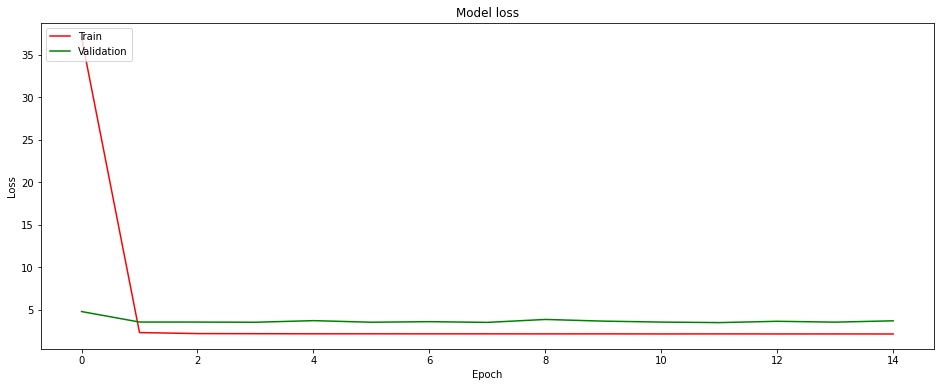

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
ax.plot(history.history['loss'], color='red')
ax.plot(history.history['val_loss'], color='green')
ax.set_title('Model loss')
ax.set_ylabel('Loss')
ax.set_xlabel('Epoch')
ax.legend(['Train', 'Validation'], loc='upper left')
plt.show()

It can be seen that from the number of epochs we performed we were unable to reduce the value of the loss

In [16]:
def load_pretrain_model(l,f,c):
  Legs=1
  Classes=1
  #Features = features_df.shape[1]
  Features=3
  model = LSTM_Model(Legs,Features,Classes)
  model.load_weights(os.path.join(Main_Dir,'LSTM_Model_Pretrain.h5'))
  inp = Input(shape=(l,f))
  x = 0
  for i in range(len(model.layers)):
    if i == 0 or i == len(model.layers)-1:
      continue
    if i == 1:
      x = LSTM(6)(inp)
    else:
      x = model.layers[i](x)
  x = Dense(c,activation='softmax',name = 'predictions_final')(x)
  model = Model(inp,x)
  return model

### **Train Again The Model**

#### **Train**

In [22]:
Legs=200
Features=40
Classes=len(Activities)
Skip=30
model = load_pretrain_model(Legs,Features,Classes)
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 6)                 1128      
_________________________________________________________________
dense (Dense)                (None, 64)                448       
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
predictions_final (Dense)    (None, 18)                594 

###################################################################
LSTM Model:
Validation Group: subject102
Train Set Size : (60067, 200, 40)
Validation Set Size : (8704, 200, 40)
Train Classes Size : (60067, 18)
Validation Classes Size : (8704, 18)
Epoch 1/10
1878/1878 [==============================] - 132s 69ms/step - loss: 0.0545 - accuracy: 0.1164 - val_loss: 0.0517 - val_accuracy: 0.1313

Epoch 00001: val_accuracy improved from -inf to 0.13132, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject102.h5
Epoch 2/10
1878/1878 [==============================] - 129s 69ms/step - loss: 0.0456 - accuracy: 0.2375 - val_loss: 0.0492 - val_accuracy: 0.2215

Epoch 00002: val_accuracy improved from 0.13132 to 0.22151, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject102.h5
Epoch 3/10
1878/1878 [==============================] - 126s 67ms/step - loss: 0.0442 - accuracy: 0.2747 - val_loss: 0.0479 - val_accuracy: 0.2246

Epoch 00003: val_accuracy 

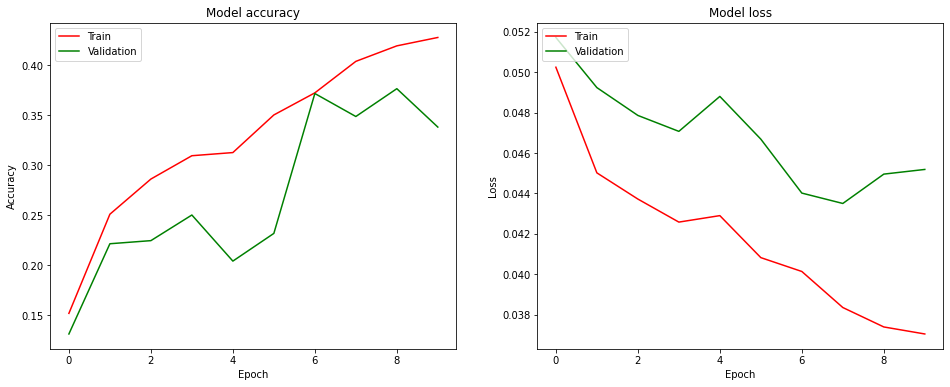

272/272 [==============================] - 4s 13ms/step - loss: 0.0452 - accuracy: 0.3381
###################################################################
LSTM Model:
Validation Group: subject103
Train Set Size : (63009, 200, 40)
Validation Set Size : (5762, 200, 40)
Train Classes Size : (63009, 18)
Validation Classes Size : (5762, 18)
Epoch 1/10
1970/1970 [==============================] - 140s 70ms/step - loss: 0.0493 - accuracy: 0.1495 - val_loss: 0.0637 - val_accuracy: 0.0269

Epoch 00001: val_accuracy improved from -inf to 0.02690, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject103.h5
Epoch 2/10
1970/1970 [==============================] - 140s 71ms/step - loss: 0.0438 - accuracy: 0.2904 - val_loss: 0.0483 - val_accuracy: 0.2005

Epoch 00002: val_accuracy improved from 0.02690 to 0.20045, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject103.h5
Epoch 3/10
1970/1970 [==============================] - 143s 73ms/step - loss: 0.041

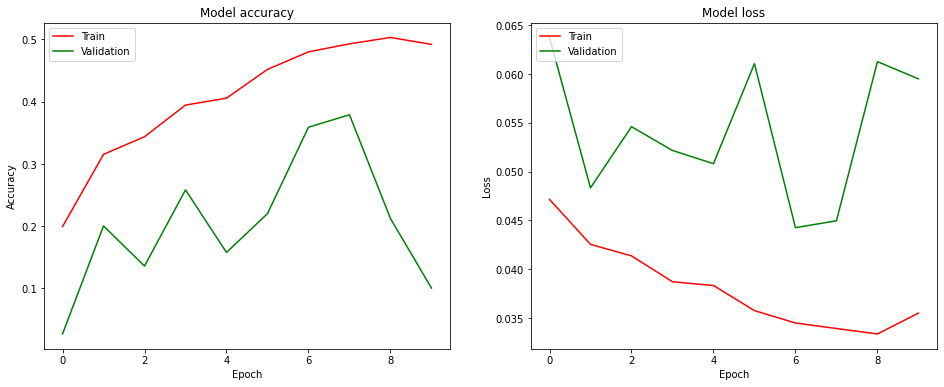

181/181 [==============================] - 3s 14ms/step - loss: 0.0595 - accuracy: 0.1007
###################################################################
LSTM Model:
Validation Group: subject104
Train Set Size : (61119, 200, 40)
Validation Set Size : (7652, 200, 40)
Train Classes Size : (61119, 18)
Validation Classes Size : (7652, 18)
Epoch 1/10
1910/1910 [==============================] - 136s 70ms/step - loss: 0.0540 - accuracy: 0.1230 - val_loss: 0.0464 - val_accuracy: 0.2322

Epoch 00001: val_accuracy improved from -inf to 0.23223, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject104.h5
Epoch 2/10
1910/1910 [==============================] - 132s 69ms/step - loss: 0.0432 - accuracy: 0.2671 - val_loss: 0.0443 - val_accuracy: 0.3396

Epoch 00002: val_accuracy improved from 0.23223 to 0.33965, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject104.h5
Epoch 3/10
1910/1910 [==============================] - 129s 68ms/step - loss: 0.041

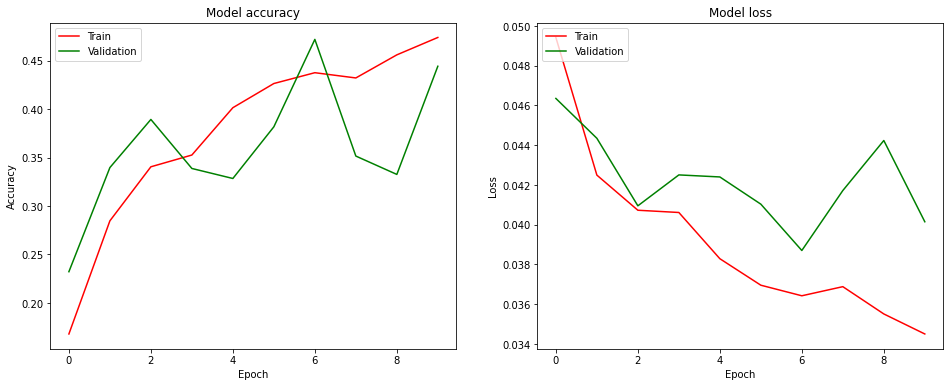

240/240 [==============================] - 3s 11ms/step - loss: 0.0401 - accuracy: 0.4442
###################################################################
LSTM Model:
Validation Group: subject105
Train Set Size : (55129, 200, 40)
Validation Set Size : (13642, 200, 40)
Train Classes Size : (55129, 18)
Validation Classes Size : (13642, 18)
Epoch 1/10
1723/1723 [==============================] - 126s 72ms/step - loss: 0.0509 - accuracy: 0.1367 - val_loss: 0.0447 - val_accuracy: 0.3607

Epoch 00001: val_accuracy improved from -inf to 0.36065, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject105.h5
Epoch 2/10
1723/1723 [==============================] - 124s 72ms/step - loss: 0.0468 - accuracy: 0.2384 - val_loss: 0.0525 - val_accuracy: 0.0881

Epoch 00002: val_accuracy did not improve from 0.36065
Epoch 3/10
1723/1723 [==============================] - 123s 72ms/step - loss: 0.0469 - accuracy: 0.2424 - val_loss: 0.0523 - val_accuracy: 0.2341

Epoch 00003: val_acc

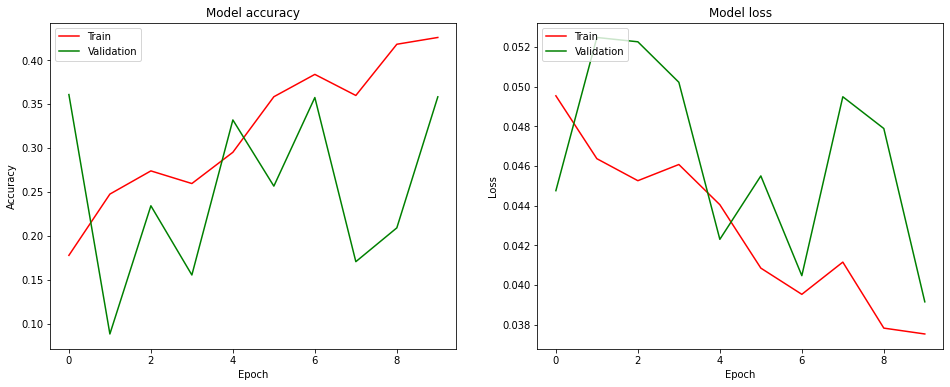

427/427 [==============================] - 6s 15ms/step - loss: 0.0391 - accuracy: 0.3581
###################################################################
LSTM Model:
Validation Group: subject106
Train Set Size : (56784, 200, 40)
Validation Set Size : (11987, 200, 40)
Train Classes Size : (56784, 18)
Validation Classes Size : (11987, 18)
Epoch 1/10
1775/1775 [==============================] - 127s 71ms/step - loss: 0.0501 - accuracy: 0.1364 - val_loss: 0.0478 - val_accuracy: 0.2915

Epoch 00001: val_accuracy improved from -inf to 0.29148, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject106.h5
Epoch 2/10
1775/1775 [==============================] - 127s 71ms/step - loss: 0.0428 - accuracy: 0.3176 - val_loss: 0.0414 - val_accuracy: 0.4170

Epoch 00002: val_accuracy improved from 0.29148 to 0.41695, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject106.h5
Epoch 3/10
1775/1775 [==============================] - 126s 71ms/step - loss: 0.0

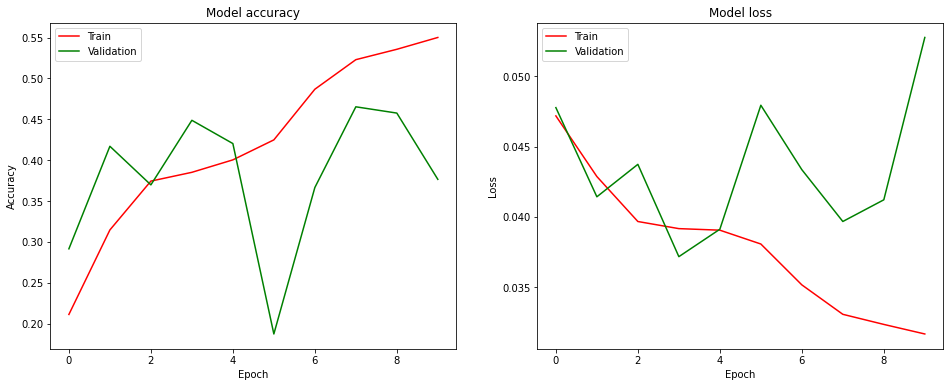

375/375 [==============================] - 5s 13ms/step - loss: 0.0528 - accuracy: 0.3765


In [23]:
from sklearn.preprocessing import OneHotEncoder
VALIDATION_ACCURACY_Pre = []
VALIDAITON_LOSS_Pre = []
for subject in ['subject102','subject103','subject104','subject105','subject106']:
  validation_group = [subject]
  train_df = Train_Set_LSTM[~Train_Set_LSTM['Name'].isin(validation_group)].copy()
  valid_df = Train_Set_LSTM[Train_Set_LSTM['Name'].isin(validation_group)].copy() 
  train_lstm_x , train_lstm_y = praper_data_LSTM(train_df,Legs)
  validation_lstm_x , validation_lstm_y = praper_data_LSTM(valid_df,Legs)
  encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
  encoder.fit(train_lstm_y.reshape(-1, 1))
  train_lstm_y = encoder.transform(train_lstm_y.reshape(-1, 1))
  validation_lstm_y = encoder.transform(validation_lstm_y.reshape(-1, 1))
  print('###################################################################')
  print("LSTM Model:")
  print("Validation Group: {}".format(subject))
  print("Train Set Size : {}".format(train_lstm_x.shape))
  print("Validation Set Size : {}".format(validation_lstm_x.shape))
  print("Train Classes Size : {}".format(train_lstm_y.shape))
  print("Validation Classes Size : {}".format(validation_lstm_y.shape))
  cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_after_pt_{}.h5'.format(subject)),
                        monitor='val_accuracy',
                        verbose=1,
                        save_best_only=True,
                        mode='max')
  model = load_pretrain_model(Legs,Features,Classes)
  model.compile(loss='mse',optimizer='adam',metrics=['accuracy'])
  history = model.fit(train_lstm_x,train_lstm_y,validation_data=(validation_lstm_x,validation_lstm_y),epochs=10,callbacks=[cp])
  plot_history(history)
  results = model.evaluate(x=validation_lstm_x,y=validation_lstm_y)
  results = dict(zip(model.metrics_names,results))
  VALIDATION_ACCURACY_Pre.append(results['accuracy'])
  VALIDAITON_LOSS_Pre.append(results['loss'])


In [53]:
arrays = [['With Pretrain','With Pretrain', 'Without Pretrain','Without Pretrain','Gap','Gap'],['Loss', 'Accuracy','Loss', 'Accuracy','Loss', 'Accuracy']]
tuples = list(zip(*arrays))
index = pd.MultiIndex.from_tuples(tuples)
list_ = []
for i in range(5):
  list_.append([VALIDAITON_LOSS_Pre[i],VALIDATION_ACCURACY_Pre[i],VALIDAITON_LOSS[i],VALIDATION_ACCURACY[i],
                VALIDAITON_LOSS[i]-VALIDAITON_LOSS_Pre[i],VALIDATION_ACCURACY_Pre[i]-VALIDATION_ACCURACY[i]])
df = pd.DataFrame(list_, index=['Subject102', 'Subject103', 'Subject104' , 'Subject105' , 'Subject106'], columns=index)

In [27]:
df

With Pretrain            ...       Gap          
                    Loss  Accuracy  ...      Loss  Accuracy
Subject102      0.045186  0.338120  ... -0.003486  0.001820
Subject103      0.059497  0.100659  ... -0.021197 -0.392041
Subject104      0.040150  0.444198  ...  0.002450  0.109198
Subject105      0.039143  0.358085  ...  0.015857  0.151185
Subject106      0.052751  0.376491  ... -0.001451  0.069091

[5 rows x 6 columns]

It can be seen that most of the divisions we made have an increase in the accuracy values ​​after the pre-processing training we did for the model but in terms of loss we got a negative improvement meaning our loss values ​​increased ​​- probably the task we performed does not fit the model and we have to perform another task or use more features to predict hand temperature.

#### **Test**

In [30]:
test_lstm_x , test_lstm_y = praper_data_LSTM(Test_Set_LSTM,200)

In [34]:
model = LSTM_Model(Legs=200,Features=40,Classes=len(Activities))
model.load_weights('/content/drive/MyDrive/DL_Ass2/LSTM_Model_after_pt_subject106.h5')
predictions = model.predict(test_lstm_x)
preds_classes = np.argmax(predictions,axis=1)
predict = np.unique(preds_classes).tolist() 
true = np.unique(Activities_id).tolist() 
class_map = list(zip(predict,true))
class_map = dict(class_map)
results = [class_map[x] for x in preds_classes]
print('LSTM Model Accuracy On Test Set : {}%'.format(round(accuracy_score(test_lstm_y,results)*100,5)))

LSTM Model Accuracy On Test Set : 34.29586%


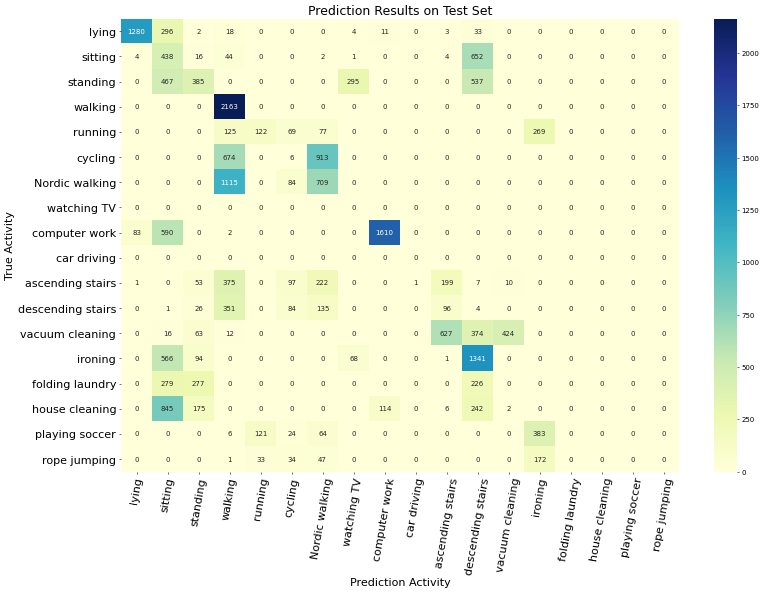

In [36]:
activities_df = activities_df.reset_index().set_index('ID')
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
sns.heatmap(confusion_matrix(test_lstm_y,results,true),ax=ax,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Test Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16) 
true_new = [activities_df.loc[x,'Activity'] for x in true]
ax.set_xticklabels(true_new)
ax.set_yticklabels(true_new)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

**Also here we can see that the higher accuracy that we get is when we predict with the model that we get when subject 106 was used as a validation group and we get a higher accuracy that the task befor so the self-surpervised task that we made was halpful , but we still suffer from overfitting and we still getting heigher losses values than the values on the train set.**

## **How To Improve The NN Model?**


**Several ways we will try to improve our model:**

* Perform a pre-training task by performing prediction using past data - this way we adapt the task to our LSTM model work that allows us to save previous states and give them more weights - so we may get more effective weights for our original process which is also based on number Points in time.


* Add Dense layers to the depth and increase the Dropout values ​​- in this way we give more depth to the features, we will expand the information and with the help of large Dropout values ​​we will try to get rid of noise data and thus more generalize the model and reduce the overfitting we have.


* Change the learning rate so that we do not get extreme jumps in values ​​- as we can see in the graphs we have extreme jumps in the values ​​between the epochs. We would like to moderate the weight update and slide more of the graph to get a more correct convergence.

* Change Validation Strategy - We have seen that in most cases when we predicted the test set using a learning model obtained from a process that yielded us the best accuracy and loss results, we received lower test set accuracy values ​​than the validation set showed us.

### **Improvement 1 - Perform Another Self-Supervised Task**

We will try to predict the acceleration value on the X-axis of the Chest IMU sensor based on 10 points in time backwards when we make a jump of 10 points forward in time.

In [ ]:
features_to_predict = ['Chest 3D Acceleration Data_16_X']
Legs=10
Classes=1
Skip = 10

In [ ]:
validation_group = ['subject104']
train_df = Train_Set_Pretrain[Train_Set_Pretrain['Name'].isin('subject103')].copy()
valid_df = Train_Set_Pretrain[Train_Set_Pretrain['Name'].isin(validation_group)].copy() 

In [ ]:
train_lstm_x , train_lstm_y = praper_data_LSTM_Pretrain(train_df , features_to_predict ,Skip,Legs)
train_lstm_x.shape , train_lstm_y.shape

((174170, 10), (174170, 1))

In [ ]:
validation_lstm_x , validation_lstm_y = praper_data_LSTM_Pretrain(valid_df , features_to_predict)
validation_lstm_x.shape , validation_lstm_y.shape

((231300, 10), (231300, 1))

In [ ]:
model = LSTM_Model(Legs,1,Classes)
model.layers[1].trainable=False
model.layers[-1].trainable=False
model.summary()
cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_Pretrain_2.h5'),
                                        monitor='val_loss',
                                        verbose=1,
                                        save_best_only=True,
                                        mode='min')

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 10, 1)]           0         
_________________________________________________________________
lstm (LSTM)                  (None, 6)                 192       
_________________________________________________________________
dense (Dense)                (None, 64)                448       
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 33    

In [ ]:
t_x = np.expand_dims(train_lstm_x.values,axis=-1)
t_y = train_lstm_y.values
v_x = np.expand_dims(validation_lstm_x.values,axis=-1)
v_y = validation_lstm_y.values
history = model.fit(t_x,t_y,validation_data=(v_x,v_y),epochs=15,callbacks=[cp])

Epoch 1/15
5443/5443 [==============================] - 35s 6ms/step - loss: 2.7029 - val_loss: 1.5564

Epoch 00001: val_loss improved from inf to 1.55638, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Pretrain_2.h5
Epoch 2/15
5443/5443 [==============================] - 34s 6ms/step - loss: 2.6047 - val_loss: 1.6122

Epoch 00002: val_loss did not improve from 1.55638
Epoch 3/15
5443/5443 [==============================] - 33s 6ms/step - loss: 2.5848 - val_loss: 1.6384

Epoch 00003: val_loss did not improve from 1.55638
Epoch 4/15
5443/5443 [==============================] - 33s 6ms/step - loss: 2.5712 - val_loss: 1.6791

Epoch 00004: val_loss did not improve from 1.55638
Epoch 5/15
5443/5443 [==============================] - 33s 6ms/step - loss: 2.5706 - val_loss: 1.7239

Epoch 00005: val_loss did not improve from 1.55638
Epoch 6/15
5443/5443 [==============================] - 33s 6ms/step - loss: 2.5542 - val_loss: 1.7023

Epoch 00006: val_loss did not improve from 1.556

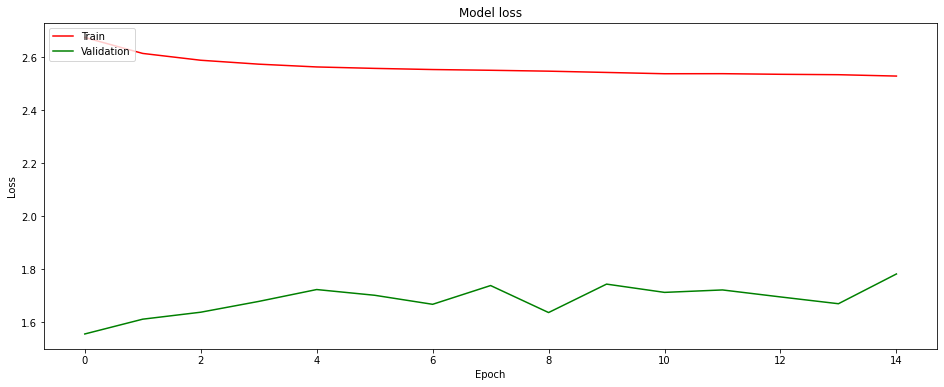

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(16,6))
ax.plot(history.history['loss'], color='red')
ax.plot(history.history['val_loss'], color='green')
ax.set_title('Model loss')
ax.set_ylabel('Loss')
ax.set_xlabel('Epoch')
ax.legend(['Train', 'Validation'], loc='upper left')
plt.show()

**It can be seen that compared to the self-learning we performed earlier we got lower loss values**

#### **Try Again on Train Set**

In [19]:
def load_pretrain_model_2(l,f,c):
  Legs=10
  Classes=1
  Features=1
  model = LSTM_Model(Legs,Features,Classes)
  model.load_weights(os.path.join(Main_Dir,'LSTM_Model_Pretrain_2.h5'))
  inp = Input(shape=(l,f))
  x = 0
  for i in range(len(model.layers)):
    if i == 0 or i == len(model.layers)-1:
      continue
    if i == 1:
      x = LSTM(6)(inp)
    else:
      x = model.layers[i](x)
  x = Dense(c,activation='softmax',name = 'predictions_final')(x)
  model = Model(inp,x)
  return model

In [20]:
Legs=200
Features=40
Classes=len(Activities)
Skip=30
model = load_pretrain_model_2(Legs,Features,Classes)
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 200, 40)]         0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 6)                 1128      
_________________________________________________________________
dense (Dense)                (None, 64)                448       
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
predictions_final (Dense)    (None, 18)                594 

###################################################################
LSTM Model:
Validation Group: subject102
Train Set Size : (60067, 200, 40)
Validation Set Size : (8704, 200, 40)
Train Classes Size : (60067, 18)
Validation Classes Size : (8704, 18)
Epoch 1/10
1878/1878 [==============================] - 139s 73ms/step - loss: 0.0490 - accuracy: 0.1727 - val_loss: 0.0478 - val_accuracy: 0.2423

Epoch 00001: val_accuracy improved from -inf to 0.24230, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject102.h5
Epoch 2/10
1878/1878 [==============================] - 135s 72ms/step - loss: 0.0445 - accuracy: 0.2913 - val_loss: 0.0433 - val_accuracy: 0.3295

Epoch 00002: val_accuracy improved from 0.24230 to 0.32950, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject102.h5
Epoch 3/10
1878/1878 [==============================] - 136s 73ms/step - loss: 0.0409 - accuracy: 0.3473 - val_loss: 0.0485 - val_accuracy: 0.2608

Epoch 00003: val_accur

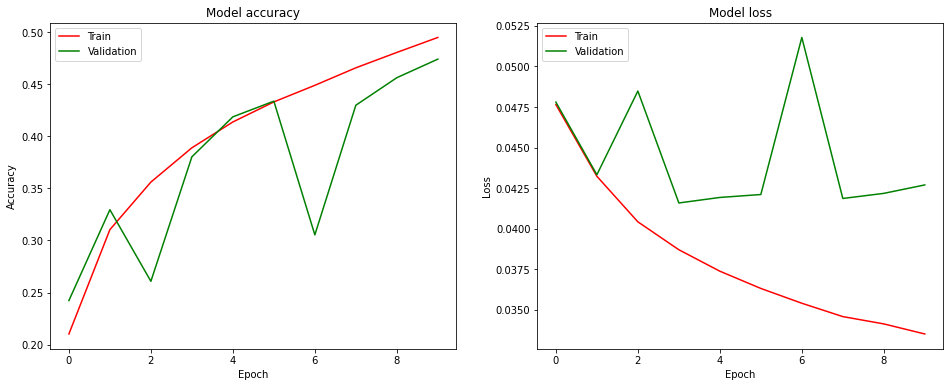

272/272 [==============================] - 4s 14ms/step - loss: 0.0427 - accuracy: 0.4740
###################################################################
LSTM Model:
Validation Group: subject103
Train Set Size : (63009, 200, 40)
Validation Set Size : (5762, 200, 40)
Train Classes Size : (63009, 18)
Validation Classes Size : (5762, 18)
Epoch 1/10
1970/1970 [==============================] - 146s 72ms/step - loss: 0.0482 - accuracy: 0.1886 - val_loss: 0.0669 - val_accuracy: 0.0389

Epoch 00001: val_accuracy improved from -inf to 0.03888, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject103.h5
Epoch 2/10
1970/1970 [==============================] - 143s 72ms/step - loss: 0.0410 - accuracy: 0.3315 - val_loss: 0.0659 - val_accuracy: 0.2621

Epoch 00002: val_accuracy improved from 0.03888 to 0.26206, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject103.h5
Epoch 3/10
1970/1970 [==============================] - 147s 75ms/step - loss: 0

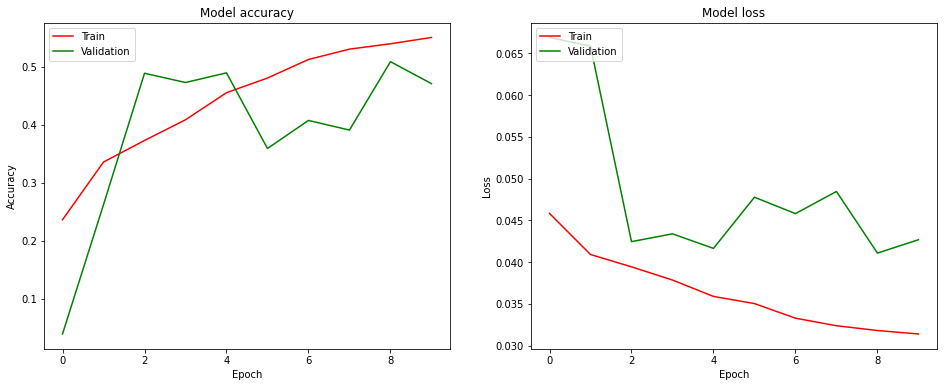

181/181 [==============================] - 3s 14ms/step - loss: 0.0427 - accuracy: 0.4708
###################################################################
LSTM Model:
Validation Group: subject104
Train Set Size : (61119, 200, 40)
Validation Set Size : (7652, 200, 40)
Train Classes Size : (61119, 18)
Validation Classes Size : (7652, 18)
Epoch 1/10
1910/1910 [==============================] - 138s 71ms/step - loss: 0.0491 - accuracy: 0.1672 - val_loss: 0.0453 - val_accuracy: 0.3562

Epoch 00001: val_accuracy improved from -inf to 0.35625, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject104.h5
Epoch 2/10
1910/1910 [==============================] - 143s 75ms/step - loss: 0.0418 - accuracy: 0.3355 - val_loss: 0.0439 - val_accuracy: 0.3104

Epoch 00002: val_accuracy did not improve from 0.35625
Epoch 3/10
1910/1910 [==============================] - 136s 71ms/step - loss: 0.0387 - accuracy: 0.3994 - val_loss: 0.0434 - val_accuracy: 0.2913

Epoch 00003: val_acc

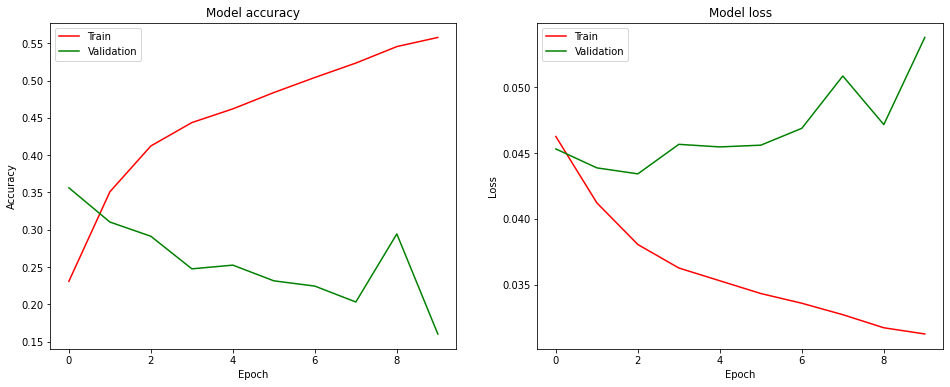

240/240 [==============================] - 3s 12ms/step - loss: 0.0538 - accuracy: 0.1604
Buffered data was truncated after reaching the output size limit.

In [ ]:
from sklearn.preprocessing import OneHotEncoder
VALIDATION_ACCURACY_Pre_2 = []
VALIDAITON_LOSS_Pre_2 = []
for subject in ['subject102','subject103','subject104','subject105','subject106']:
  validation_group = [subject]
  train_df = Train_Set_LSTM[~Train_Set_LSTM['Name'].isin(validation_group)].copy()
  valid_df = Train_Set_LSTM[Train_Set_LSTM['Name'].isin(validation_group)].copy() 
  train_lstm_x , train_lstm_y = praper_data_LSTM(train_df,Legs)
  validation_lstm_x , validation_lstm_y = praper_data_LSTM(valid_df,Legs)
  encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
  encoder.fit(train_lstm_y.reshape(-1, 1))
  train_lstm_y = encoder.transform(train_lstm_y.reshape(-1, 1))
  validation_lstm_y = encoder.transform(validation_lstm_y.reshape(-1, 1))
  print('###################################################################')
  print("LSTM Model:")
  print("Validation Group: {}".format(subject))
  print("Train Set Size : {}".format(train_lstm_x.shape))
  print("Validation Set Size : {}".format(validation_lstm_x.shape))
  print("Train Classes Size : {}".format(train_lstm_y.shape))
  print("Validation Classes Size : {}".format(validation_lstm_y.shape))
  cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_After_pt_2_{}.h5'.format(subject)),
                        monitor='val_accuracy',
                        verbose=1,
                        save_best_only=True,
                        mode='max')
  model = load_pretrain_model_2(Legs,Features,Classes)
  model.compile(loss='mse',optimizer='adam',metrics=['accuracy'])
  history = model.fit(train_lstm_x,train_lstm_y,validation_data=(validation_lstm_x,validation_lstm_y),epochs=10,callbacks=[cp])
  plot_history(history)
  results = model.evaluate(x=validation_lstm_x,y=validation_lstm_y)
  results = dict(zip(model.metrics_names,results))
  VALIDATION_ACCURACY_Pre_2.append(results['accuracy'])
  VALIDAITON_LOSS_Pre_2.append(results['loss'])


**Continue with other subject as validation due to RAM LIMIT**

###################################################################
LSTM Model:
Validation Group: subject105
Train Set Size : (55129, 200, 40)
Validation Set Size : (13642, 200, 40)
Train Classes Size : (55129, 18)
Validation Classes Size : (13642, 18)
Epoch 1/10
1723/1723 [==============================] - 126s 72ms/step - loss: 0.0495 - accuracy: 0.1633 - val_loss: 0.0492 - val_accuracy: 0.2101

Epoch 00001: val_accuracy improved from -inf to 0.21009, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject105.h5
Epoch 2/10
1723/1723 [==============================] - 121s 70ms/step - loss: 0.0415 - accuracy: 0.3473 - val_loss: 0.0493 - val_accuracy: 0.2417

Epoch 00002: val_accuracy improved from 0.21009 to 0.24168, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject105.h5
Epoch 3/10
1723/1723 [==============================] - 129s 75ms/step - loss: 0.0415 - accuracy: 0.3627 - val_loss: 0.0450 - val_accuracy: 0.2961

Epoch 00003: val_acc

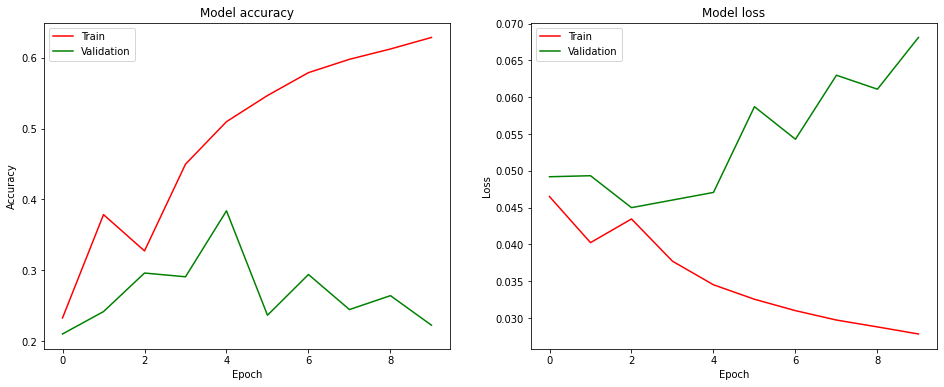

427/427 [==============================] - 6s 15ms/step - loss: 0.0681 - accuracy: 0.2225
###################################################################
LSTM Model:
Validation Group: subject106
Train Set Size : (56784, 200, 40)
Validation Set Size : (11987, 200, 40)
Train Classes Size : (56784, 18)
Validation Classes Size : (11987, 18)
Epoch 1/10
1775/1775 [==============================] - 128s 71ms/step - loss: 0.0498 - accuracy: 0.1580 - val_loss: 0.0382 - val_accuracy: 0.4263

Epoch 00001: val_accuracy improved from -inf to 0.42630, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject106.h5
Epoch 2/10
1775/1775 [==============================] - 124s 70ms/step - loss: 0.0415 - accuracy: 0.3413 - val_loss: 0.0369 - val_accuracy: 0.4152

Epoch 00002: val_accuracy did not improve from 0.42630
Epoch 3/10
1775/1775 [==============================] - 127s 72ms/step - loss: 0.0388 - accuracy: 0.3999 - val_loss: 0.0367 - val_accuracy: 0.4501

Epoch 00003: val_a

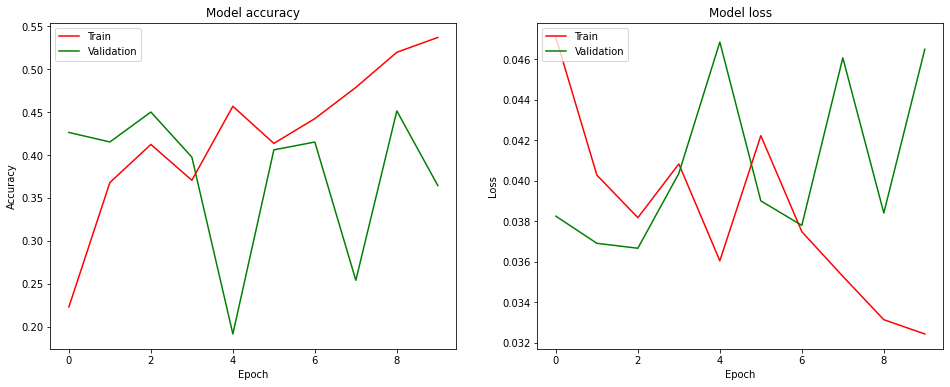

375/375 [==============================] - 5s 13ms/step - loss: 0.0465 - accuracy: 0.3644


In [23]:
from sklearn.preprocessing import OneHotEncoder
VALIDATION_ACCURACY_Pre_2 = []
VALIDAITON_LOSS_Pre_2 = []
for subject in ['subject105','subject106']:
  validation_group = [subject]
  train_df = Train_Set_LSTM[~Train_Set_LSTM['Name'].isin(validation_group)].copy()
  valid_df = Train_Set_LSTM[Train_Set_LSTM['Name'].isin(validation_group)].copy() 
  train_lstm_x , train_lstm_y = praper_data_LSTM(train_df,Legs)
  validation_lstm_x , validation_lstm_y = praper_data_LSTM(valid_df,Legs)
  encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
  encoder.fit(train_lstm_y.reshape(-1, 1))
  train_lstm_y = encoder.transform(train_lstm_y.reshape(-1, 1))
  validation_lstm_y = encoder.transform(validation_lstm_y.reshape(-1, 1))
  print('###################################################################')
  print("LSTM Model:")
  print("Validation Group: {}".format(subject))
  print("Train Set Size : {}".format(train_lstm_x.shape))
  print("Validation Set Size : {}".format(validation_lstm_x.shape))
  print("Train Classes Size : {}".format(train_lstm_y.shape))
  print("Validation Classes Size : {}".format(validation_lstm_y.shape))
  cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_After_pt_2_{}.h5'.format(subject)),
                        monitor='val_accuracy',
                        verbose=1,
                        save_best_only=True,
                        mode='max')
  model = load_pretrain_model_2(Legs,Features,Classes)
  model.compile(loss='mse',optimizer='adam',metrics=['accuracy'])
  history = model.fit(train_lstm_x,train_lstm_y,validation_data=(validation_lstm_x,validation_lstm_y),epochs=10,callbacks=[cp])
  plot_history(history)
  results = model.evaluate(x=validation_lstm_x,y=validation_lstm_y)
  results = dict(zip(model.metrics_names,results))
  VALIDATION_ACCURACY_Pre_2.append(results['accuracy'])
  VALIDAITON_LOSS_Pre_2.append(results['loss'])


In [64]:
arrays = [['With Pretrain','With Pretrain', 'Without Pretrain','Without Pretrain','Gap','Gap'],['Loss', 'Accuracy','Loss', 'Accuracy','Loss', 'Accuracy']]
tuples = list(zip(*arrays))
index = pd.MultiIndex.from_tuples(tuples)
list_ = []
for i in range(5):
  list_.append([VALIDAITON_LOSS_Pre_2[i],VALIDATION_ACCURACY_Pre_2[i],VALIDAITON_LOSS[i],VALIDATION_ACCURACY[i],
                VALIDAITON_LOSS[i]-VALIDAITON_LOSS_Pre_2[i],VALIDATION_ACCURACY_Pre_2[i]-VALIDATION_ACCURACY[i]])
df = pd.DataFrame(list_, index=['Subject102', 'Subject103', 'Subject104' , 'Subject105' , 'Subject106'], columns=index)

In [65]:
df

With Pretrain          Without Pretrain              Gap         
                    Loss Accuracy             Loss Accuracy    Loss Accuracy
Subject102        0.0427   0.4740           0.0417   0.3363 -0.0010   0.1377
Subject103        0.0427   0.4708           0.0383   0.4927 -0.0044  -0.0219
Subject104        0.0538   0.1604           0.0426   0.3350 -0.0112  -0.1746
Subject105        0.0681   0.2225           0.0550   0.2069 -0.0131   0.0156
Subject106        0.0465   0.3644           0.0513   0.3074  0.0048   0.0570

**Now we usually have an increase in loss values ​​and a small increase in accuracy values ​​but even here we still suffer from overfitting and extreme jumps between the various epochs.**

#### **Try Again on Test Set**

In [31]:
test_lstm_x , test_lstm_y = praper_data_LSTM(Test_Set_LSTM,200)

In [34]:
model.load_weights('/content/drive/MyDrive/DL_Ass2/LSTM_Model_After_pt_2_subject102.h5')
predictions = model.predict(test_lstm_x)
preds_classes = np.argmax(predictions,axis=1)
predict = np.unique(preds_classes).tolist() 
true = np.unique(Activities_id).tolist() 
class_map = list(zip(predict,true))
class_map = dict(class_map)
results = [class_map[x] for x in preds_classes]
print('LSTM Model Accuracy On Test Set : {}%'.format(round(accuracy_score(test_lstm_y,results)*100,5)))

LSTM Model Accuracy On Test Set : 39.13653%


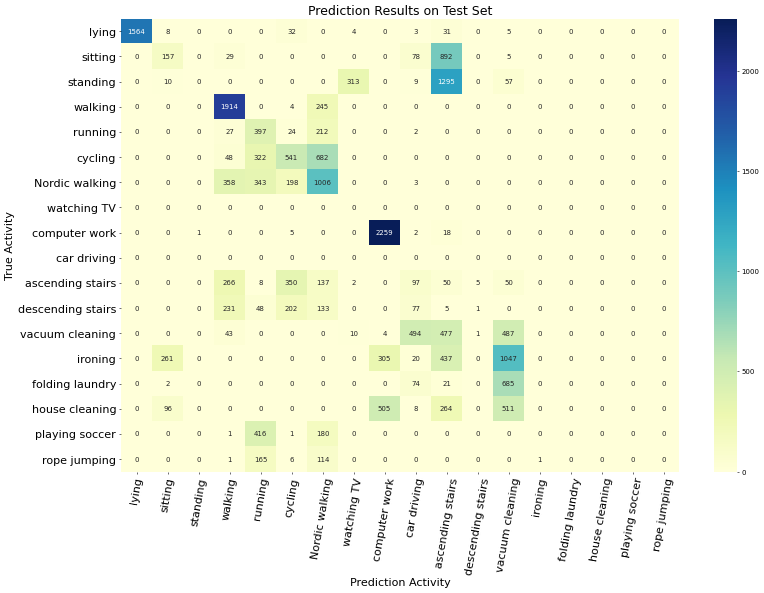

In [35]:
activities_df = activities_df.reset_index().set_index('ID')
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
sns.heatmap(confusion_matrix(test_lstm_y,results,true),ax=ax,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Test Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16) 
true_new = [activities_df.loc[x,'Activity'] for x in true]
ax.set_xticklabels(true_new)
ax.set_yticklabels(true_new)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

**Unlike the previous tasks when we predict the test set we used the trained model we received that gave us the best performance both in terms of accuracy and loss values ​​and indeed we got a high percentage of accuracy on the test set, here too there is improvement - we can conclude that the self-supervised task we performed did contribute to learning and weight gain.**

### **Improvement 2 - Add Deep Layers And Increas Dropout**

#### **Train**

In [19]:
from tensorflow.keras.optimizers import Adam
def LSTM_Model_Improved_2(Legs,Features,Classes):
  inp = Input(shape=(Legs,Features))
  x = LSTM(16)(inp)
  x = Dense(128,activation='relu')(x)
  x = Dropout(0.3)(x)
  x = Dense(64,activation='relu')(x)
  x = Dropout(0.5)(x)
  x = Dense(32,activation='relu')(x)
  x = Dropout(0.8)(x)
  x = Dense(Classes,activation='softmax')(x)
  model = Model(inp,x)
  model.compile(loss='mse',optimizer='adam',metrics=['accuracy'])
  return model

In [87]:
Legs=200
Features = 40
Classes = len(Activities)
Skip=30
model = LSTM_Model_Improved_2(Legs, Features, Classes)
model.summary()

Model: "model_46"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_47 (InputLayer)        [(None, 200, 40)]         0         
_________________________________________________________________
lstm_46 (LSTM)               (None, 16)                3648      
_________________________________________________________________
dense_152 (Dense)            (None, 128)               2176      
_________________________________________________________________
dropout_106 (Dropout)        (None, 128)               0         
_________________________________________________________________
dense_153 (Dense)            (None, 64)                8256      
_________________________________________________________________
dropout_107 (Dropout)        (None, 64)                0         
_________________________________________________________________
dense_154 (Dense)            (None, 32)                208

###################################################################
LSTM Model:
Validation Group: subject102
Train Set Size : (60067, 200, 40)
Validation Set Size : (8704, 200, 40)
Train Classes Size : (60067, 18)
Validation Classes Size : (8704, 18)
Epoch 1/10
1878/1878 [==============================] - 128s 67ms/step - loss: 0.0497 - accuracy: 0.1540 - val_loss: 0.0488 - val_accuracy: 0.2508

Epoch 00001: val_accuracy improved from -inf to 0.25080, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject102.h5
Epoch 2/10
1878/1878 [==============================] - 121s 65ms/step - loss: 0.0416 - accuracy: 0.3312 - val_loss: 0.0469 - val_accuracy: 0.2077

Epoch 00002: val_accuracy did not improve from 0.25080
Epoch 3/10
1878/1878 [==============================] - 122s 65ms/step - loss: 0.0424 - accuracy: 0.3169 - val_loss: 0.0444 - val_accuracy: 0.2868

Epoch 00003: val_accuracy improved from 0.25080 to 0.28676, saving model to /content/drive/MyDrive/DL_Ass2/LST

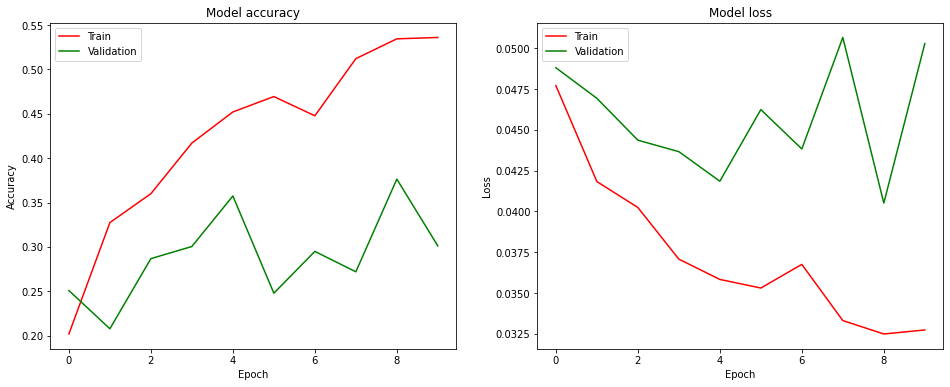

272/272 [==============================] - 4s 14ms/step - loss: 0.0503 - accuracy: 0.3011
###################################################################
LSTM Model:
Validation Group: subject103
Train Set Size : (63009, 200, 40)
Validation Set Size : (5762, 200, 40)
Train Classes Size : (63009, 18)
Validation Classes Size : (5762, 18)
Epoch 1/10
1970/1970 [==============================] - 134s 66ms/step - loss: 0.0498 - accuracy: 0.1459 - val_loss: 0.0448 - val_accuracy: 0.4747

Epoch 00001: val_accuracy improved from -inf to 0.47466, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject103.h5
Epoch 2/10
1970/1970 [==============================] - 142s 72ms/step - loss: 0.0420 - accuracy: 0.3119 - val_loss: 0.0382 - val_accuracy: 0.4991

Epoch 00002: val_accuracy improved from 0.47466 to 0.49913, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject103.h5
Epoch 3/10
1970/1970 [==============================] - 143s 72ms/step - loss: 0

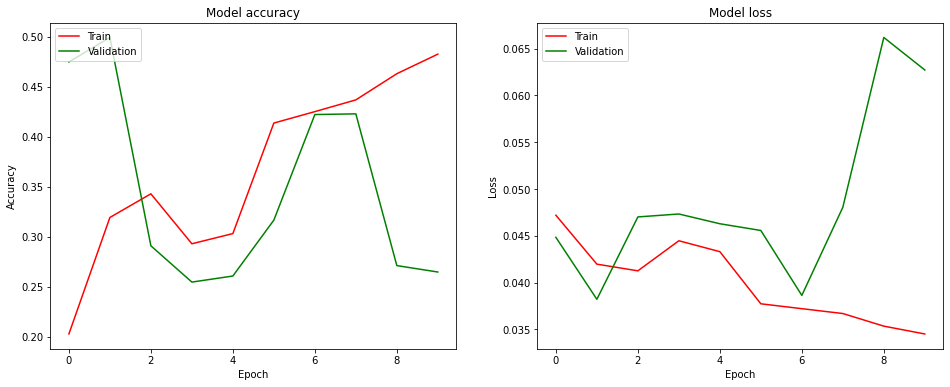

181/181 [==============================] - 2s 13ms/step - loss: 0.0627 - accuracy: 0.2647
###################################################################
LSTM Model:
Validation Group: subject104
Train Set Size : (61119, 200, 40)
Validation Set Size : (7652, 200, 40)
Train Classes Size : (61119, 18)
Validation Classes Size : (7652, 18)
Epoch 1/10
1910/1910 [==============================] - 128s 66ms/step - loss: 0.0492 - accuracy: 0.1583 - val_loss: 0.0444 - val_accuracy: 0.3402

Epoch 00001: val_accuracy improved from -inf to 0.34017, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject104.h5
Epoch 2/10
1910/1910 [==============================] - 124s 65ms/step - loss: 0.0430 - accuracy: 0.2855 - val_loss: 0.0426 - val_accuracy: 0.4171

Epoch 00002: val_accuracy improved from 0.34017 to 0.41715, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject104.h5
Epoch 3/10
1910/1910 [==============================] - 124s 65ms/step - loss: 0

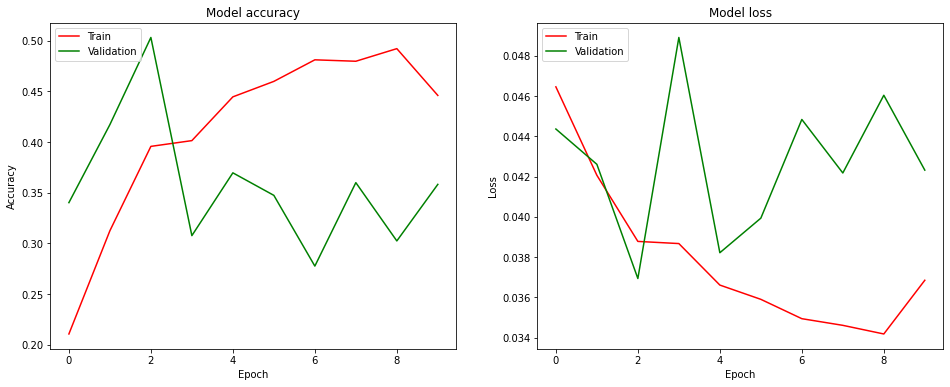

209/240 [=========================>....] - ETA: 0s - loss: 0.0419 - accuracy: 0.3801Buffered data was truncated after reaching the output size limit.

In [ ]:
from sklearn.preprocessing import OneHotEncoder
VALIDATION_ACCURACY_IMP_2 = []
VALIDAITON_LOSS_IMP_2 = []
for subject in ['subject102','subject103','subject104','subject105','subject106']:
    validation_group = [subject]
    train_df = Train_Set_LSTM[~Train_Set_LSTM['Name'].isin(validation_group)].copy()
    valid_df = Train_Set_LSTM[Train_Set_LSTM['Name'].isin(validation_group)].copy() 
    train_lstm_x , train_lstm_y = praper_data_LSTM(train_df,Legs)
    validation_lstm_x , validation_lstm_y = praper_data_LSTM(valid_df,Legs)
    encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
    encoder.fit(train_lstm_y.reshape(-1, 1))
    train_lstm_y = encoder.transform(train_lstm_y.reshape(-1, 1))
    validation_lstm_y = encoder.transform(validation_lstm_y.reshape(-1, 1))
    print('###################################################################')
    print("LSTM Model:")
    print("Validation Group: {}".format(subject))
    print("Train Set Size : {}".format(train_lstm_x.shape))
    print("Validation Set Size : {}".format(validation_lstm_x.shape))
    print("Train Classes Size : {}".format(train_lstm_y.shape))
    print("Validation Classes Size : {}".format(validation_lstm_y.shape))
    cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_Improved_3_{}.h5'.format(subject)),
                         monitor='val_accuracy',
                         verbose=1,
                         save_best_only=True,
                         mode='max')
    model = LSTM_Model_Improved_2(Legs, Features, Classes)
    history = model.fit(train_lstm_x,train_lstm_y,validation_data=(validation_lstm_x,validation_lstm_y),epochs=10,callbacks=[cp])
    plot_history(history)
    results = model.evaluate(x=validation_lstm_x,y=validation_lstm_y)
    results = dict(zip(model.metrics_names,results))
    VALIDATION_ACCURACY_IMP_2.append(results['accuracy'])
    VALIDAITON_LOSS_IMP_2.append(results['loss'])

Continue subject 105 and 106 here because of RAM limitations

###################################################################
LSTM Model:
Validation Group: subject105
Train Set Size : (55129, 200, 40)
Validation Set Size : (13642, 200, 40)
Train Classes Size : (55129, 18)
Validation Classes Size : (13642, 18)
Epoch 1/10
1723/1723 [==============================] - 115s 66ms/step - loss: 0.0511 - accuracy: 0.1193 - val_loss: 0.0486 - val_accuracy: 0.2185

Epoch 00001: val_accuracy improved from -inf to 0.21852, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject105.h5
Epoch 2/10
1723/1723 [==============================] - 114s 66ms/step - loss: 0.0432 - accuracy: 0.2985 - val_loss: 0.0474 - val_accuracy: 0.2791

Epoch 00002: val_accuracy improved from 0.21852 to 0.27914, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject105.h5
Epoch 3/10
1723/1723 [==============================] - 113s 65ms/step - loss: 0.0406 - accuracy: 0.3620 - val_loss: 0.0527 - val_accuracy: 0.1755

Epoch 00003: val_acc

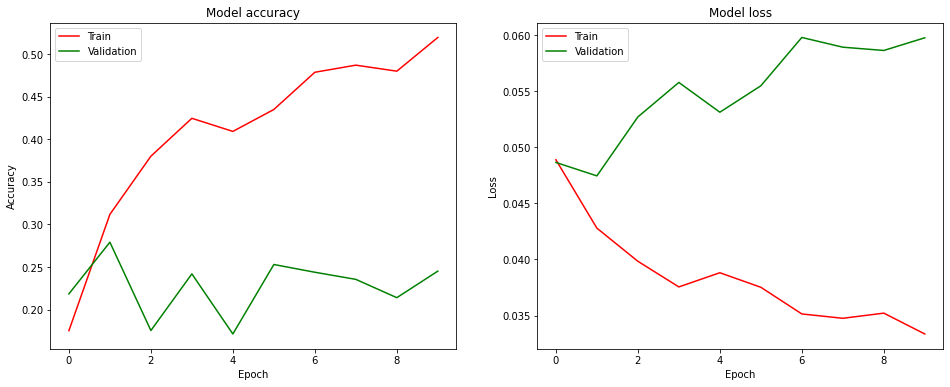

427/427 [==============================] - 6s 13ms/step - loss: 0.0598 - accuracy: 0.2452
###################################################################
LSTM Model:
Validation Group: subject106
Train Set Size : (56784, 200, 40)
Validation Set Size : (11987, 200, 40)
Train Classes Size : (56784, 18)
Validation Classes Size : (11987, 18)
Epoch 1/10
1775/1775 [==============================] - 118s 66ms/step - loss: 0.0497 - accuracy: 0.1538 - val_loss: 0.0433 - val_accuracy: 0.3100

Epoch 00001: val_accuracy improved from -inf to 0.31000, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject106.h5
Epoch 2/10
1775/1775 [==============================] - 118s 66ms/step - loss: 0.0425 - accuracy: 0.3039 - val_loss: 0.0462 - val_accuracy: 0.2323

Epoch 00002: val_accuracy did not improve from 0.31000
Epoch 3/10
1775/1775 [==============================] - 118s 66ms/step - loss: 0.0409 - accuracy: 0.3497 - val_loss: 0.0504 - val_accuracy: 0.2436

Epoch 00003: val_a

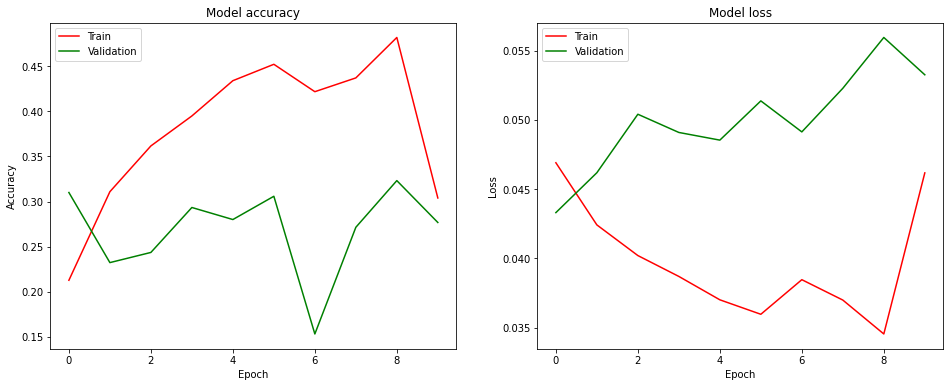

375/375 [==============================] - 6s 16ms/step - loss: 0.0533 - accuracy: 0.2768


In [20]:
from sklearn.preprocessing import OneHotEncoder
VALIDATION_ACCURACY_IMP_2 = []
VALIDAITON_LOSS_IMP_2 = []
for subject in ['subject105','subject106']:
    validation_group = [subject]
    train_df = Train_Set_LSTM[~Train_Set_LSTM['Name'].isin(validation_group)].copy()
    valid_df = Train_Set_LSTM[Train_Set_LSTM['Name'].isin(validation_group)].copy() 
    train_lstm_x , train_lstm_y = praper_data_LSTM(train_df,Legs)
    validation_lstm_x , validation_lstm_y = praper_data_LSTM(valid_df,Legs)
    encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
    encoder.fit(train_lstm_y.reshape(-1, 1))
    train_lstm_y = encoder.transform(train_lstm_y.reshape(-1, 1))
    validation_lstm_y = encoder.transform(validation_lstm_y.reshape(-1, 1))
    print('###################################################################')
    print("LSTM Model:")
    print("Validation Group: {}".format(subject))
    print("Train Set Size : {}".format(train_lstm_x.shape))
    print("Validation Set Size : {}".format(validation_lstm_x.shape))
    print("Train Classes Size : {}".format(train_lstm_y.shape))
    print("Validation Classes Size : {}".format(validation_lstm_y.shape))
    cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_Improved_3_{}.h5'.format(subject)),
                         monitor='val_accuracy',
                         verbose=1,
                         save_best_only=True,
                         mode='max')
    model = LSTM_Model_Improved_2(Legs, Features, Classes)
    history = model.fit(train_lstm_x,train_lstm_y,validation_data=(validation_lstm_x,validation_lstm_y),epochs=10,callbacks=[cp])
    plot_history(history)
    results = model.evaluate(x=validation_lstm_x,y=validation_lstm_y)
    results = dict(zip(model.metrics_names,results))
    VALIDATION_ACCURACY_IMP_2.append(results['accuracy'])
    VALIDAITON_LOSS_IMP_2.append(results['loss'])

In [34]:
arrays = [['Improve Model','Improve Model', 'First Model','First Model','Gap','Gap'],['Loss', 'Accuracy','Loss', 'Accuracy','Loss', 'Accuracy']]
tuples = list(zip(*arrays))
index = pd.MultiIndex.from_tuples(tuples)
list_ = []
for i in range(5):
  list_.append([VALIDAITON_LOSS_IMP_2[i],VALIDATION_ACCURACY_IMP_2[i],VALIDAITON_LOSS[i],VALIDATION_ACCURACY[i],
                VALIDAITON_LOSS[i]-VALIDAITON_LOSS_IMP_2[i],VALIDATION_ACCURACY_IMP_2[i]-VALIDATION_ACCURACY[i]])
df = pd.DataFrame(list_, index=['Subject102', 'Subject103', 'Subject104' , 'Subject105' , 'Subject106'], columns=index)

In [35]:
df

Improve Model          First Model              Gap         
                    Loss Accuracy        Loss Accuracy    Loss Accuracy
Subject102        0.0503   0.3011      0.0417   0.3363 -0.0086  -0.0352
Subject103        0.0627   0.2647      0.0383   0.4927 -0.0244  -0.2280
Subject104        0.0419   0.3801      0.0426   0.3350  0.0007   0.0451
Subject105        0.0598   0.2452      0.0550   0.2069 -0.0048   0.0383
Subject106        0.0533   0.2768      0.0513   0.3074 -0.0020  -0.0306

#### **Test**

In [24]:
test_lstm_x , test_lstm_y = praper_data_LSTM(Test_Set_LSTM,200)

In [29]:
model = LSTM_Model_Improved_3(200,40,18)
model.load_weights('/content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_3_subject102.h5')
predictions = model.predict(test_lstm_x)
preds_classes = np.argmax(predictions,axis=1)
predict = np.unique(preds_classes).tolist() 
true = np.unique(Activities_id).tolist() 
class_map = list(zip(predict,true))
class_map = dict(class_map)
results = [class_map[x] for x in preds_classes]
print('LSTM Model Accuracy On Test Set : {}%'.format(round(accuracy_score(test_lstm_y,results)*100,5)))

LSTM Model Accuracy On Test Set : 35.84244%


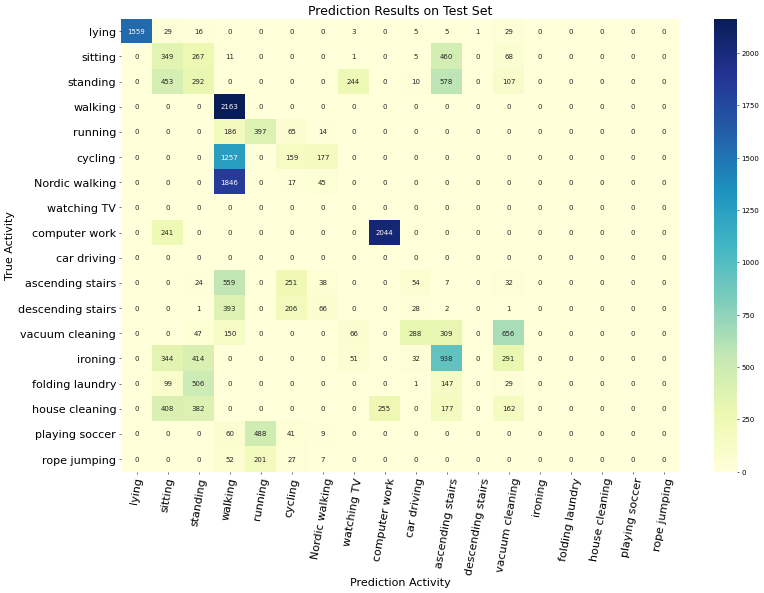

In [30]:
activities_df = activities_df.reset_index().set_index('ID')
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
sns.heatmap(confusion_matrix(test_lstm_y,results,true),ax=ax,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Test Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16) 
true_new = [activities_df.loc[x,'Activity'] for x in true]
ax.set_xticklabels(true_new)
ax.set_yticklabels(true_new)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

### **Improvement 3 - Reducing Dropout Values And Add Another Dense Layer with The Same Size**

Reducing the dropout values ​​and adding a layer at a similar depth - In this way we will try to keep the important features ​​and filter noise factors with the help of the 2 layers that are the same size

#### **Train**

In [ ]:
from tensorflow.keras.optimizers import Adam
def LSTM_Model_Improved_3(Legs,Features,Classes):
  inp = Input(shape=(Legs,Features))
  x = LSTM(10)(inp)
  x = Dense(32,activation='relu')(x)
  x = Dropout(0.35)(x)
  x = Dense(32,activation='relu')(x)
  x = Dropout(0.5)(x)
  x = Dense(Classes,activation='softmax')(x)
  model = Model(inp,x)
  model.compile(loss='mse',optimizer='adam',metrics=['accuracy'])
  return model

In [ ]:
Legs=200
Features = 40
Classes = len(Activities)
Skip=30
model = LSTM_Model_Improved_3(Legs, Features, Classes)
model.summary()

Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 200, 40)]         0         
_________________________________________________________________
lstm_15 (LSTM)               (None, 10)                2040      
_________________________________________________________________
dense_43 (Dense)             (None, 32)                352       
_________________________________________________________________
dropout_31 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_44 (Dense)             (None, 32)                1056      
_________________________________________________________________
dropout_32 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_45 (Dense)             (None, 18)                594

###################################################################
LSTM Model:
Validation Group: subject102
Train Set Size : (60067, 200, 40)
Validation Set Size : (8704, 200, 40)
Train Classes Size : (60067, 18)
Validation Classes Size : (8704, 18)
Epoch 1/10
1878/1878 [==============================] - 126s 66ms/step - loss: 0.0478 - accuracy: 0.1862 - val_loss: 0.0494 - val_accuracy: 0.1614

Epoch 00001: val_accuracy improved from -inf to 0.16142, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject102.h5
Epoch 2/10
1878/1878 [==============================] - 133s 71ms/step - loss: 0.0402 - accuracy: 0.3447 - val_loss: 0.0453 - val_accuracy: 0.2984

Epoch 00002: val_accuracy improved from 0.16142 to 0.29837, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject102.h5
Epoch 3/10
1878/1878 [==============================] - 136s 72ms/step - loss: 0.0436 - accuracy: 0.3016 - val_loss: 0.0470 - val_accuracy: 0.2062

Epoch 00003: val_accur

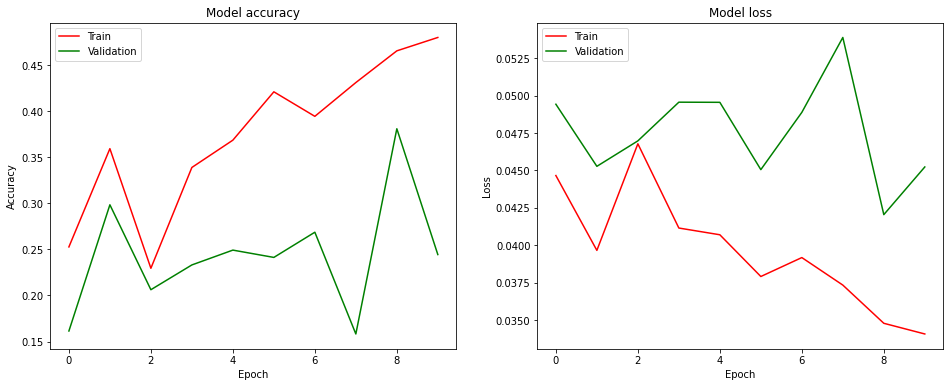

272/272 [==============================] - 4s 14ms/step - loss: 0.0452 - accuracy: 0.2444
###################################################################
LSTM Model:
Validation Group: subject103
Train Set Size : (63009, 200, 40)
Validation Set Size : (5762, 200, 40)
Train Classes Size : (63009, 18)
Validation Classes Size : (5762, 18)
Epoch 1/10
1970/1970 [==============================] - 132s 66ms/step - loss: 0.0497 - accuracy: 0.1464 - val_loss: 0.0520 - val_accuracy: 0.0949

Epoch 00001: val_accuracy improved from -inf to 0.09493, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject103.h5
Epoch 2/10
1970/1970 [==============================] - 137s 69ms/step - loss: 0.0424 - accuracy: 0.2904 - val_loss: 0.0545 - val_accuracy: 0.3087

Epoch 00002: val_accuracy improved from 0.09493 to 0.30875, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject103.h5
Epoch 3/10
1970/1970 [==============================] - 137s 70ms/step - loss: 0

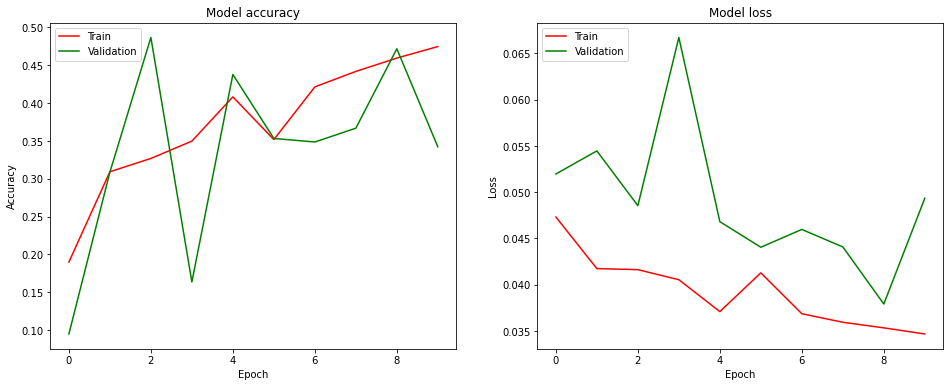

181/181 [==============================] - 3s 16ms/step - loss: 0.0493 - accuracy: 0.3422
###################################################################
LSTM Model:
Validation Group: subject104
Train Set Size : (61119, 200, 40)
Validation Set Size : (7652, 200, 40)
Train Classes Size : (61119, 18)
Validation Classes Size : (7652, 18)
Epoch 1/10
1910/1910 [==============================] - 132s 68ms/step - loss: 0.0501 - accuracy: 0.1610 - val_loss: 0.0473 - val_accuracy: 0.2982

Epoch 00001: val_accuracy improved from -inf to 0.29822, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject104.h5
Epoch 2/10
1910/1910 [==============================] - 132s 69ms/step - loss: 0.0434 - accuracy: 0.2982 - val_loss: 0.0424 - val_accuracy: 0.3498

Epoch 00002: val_accuracy improved from 0.29822 to 0.34984, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject104.h5
Epoch 3/10
1910/1910 [==============================] - 137s 72ms/step - loss: 0

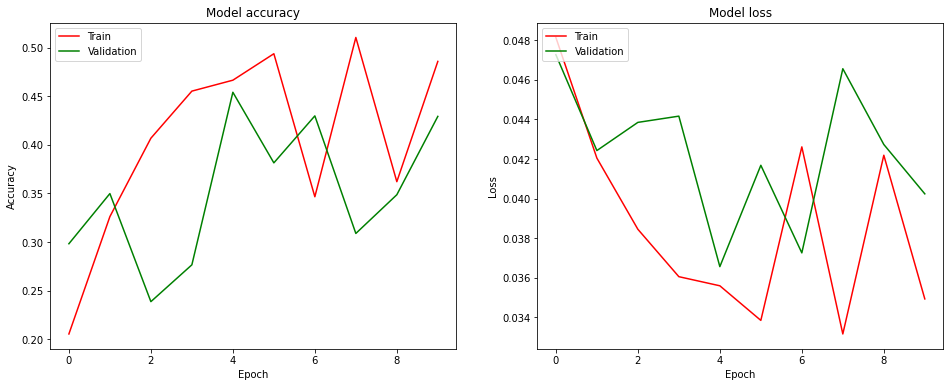

240/240 [==============================] - 4s 15ms/step - loss: 0.0402 - accuracy: 0.4293
###################################################################
LSTM Model:
Validation Group: subject105
Train Set Size : (55129, 200, 40)
Validation Set Size : (13642, 200, 40)
Train Classes Size : (55129, 18)
Validation Classes Size : (13642, 18)
Epoch 1/10
1723/1723 [==============================] - 122s 70ms/step - loss: 0.0489 - accuracy: 0.1741 - val_loss: 0.0471 - val_accuracy: 0.2339

Epoch 00001: val_accuracy improved from -inf to 0.23391, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject105.h5
Epoch 2/10
1723/1723 [==============================] - 122s 71ms/step - loss: 0.0401 - accuracy: 0.3751 - val_loss: 0.0495 - val_accuracy: 0.2083

Epoch 00002: val_accuracy did not improve from 0.23391
Epoch 3/10
1723/1723 [==============================] - 122s 71ms/step - loss: 0.0381 - accuracy: 0.4172 - val_loss: 0.0519 - val_accuracy: 0.2395

Epoch 00003: val_a

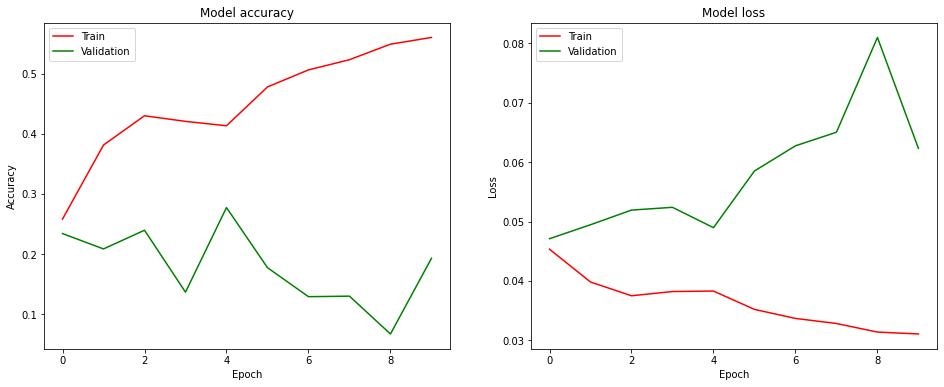

427/427 [==============================] - 6s 14ms/step - loss: 0.0623 - accuracy: 0.1927
###################################################################
LSTM Model:
Validation Group: subject106
Train Set Size : (56784, 200, 40)
Validation Set Size : (11987, 200, 40)
Train Classes Size : (56784, 18)
Validation Classes Size : (11987, 18)
Epoch 1/10
1775/1775 [==============================] - 126s 70ms/step - loss: 0.0504 - accuracy: 0.1476 - val_loss: 0.0418 - val_accuracy: 0.3376

Epoch 00001: val_accuracy improved from -inf to 0.33762, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject106.h5
Epoch 2/10
1775/1775 [==============================] - 125s 71ms/step - loss: 0.0432 - accuracy: 0.2968 - val_loss: 0.0409 - val_accuracy: 0.3916

Epoch 00002: val_accuracy improved from 0.33762 to 0.39159, saving model to /content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject106.h5
Epoch 3/10
1775/1775 [==============================] - 128s 72ms/step - loss:

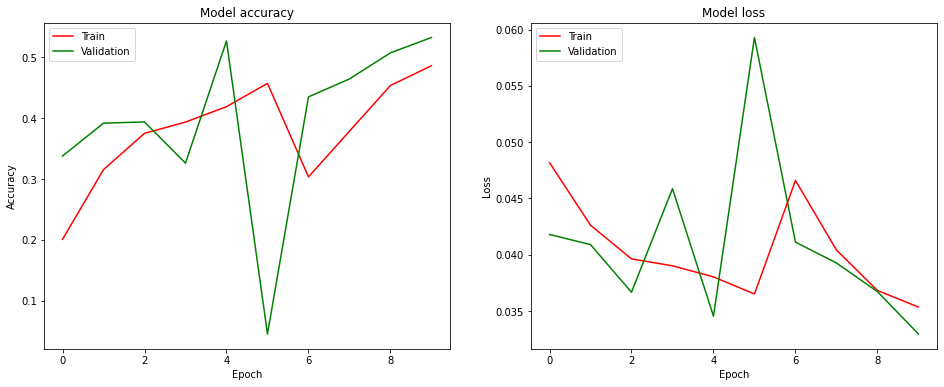

375/375 [==============================] - 5s 14ms/step - loss: 0.0330 - accuracy: 0.5322


In [ ]:
from sklearn.preprocessing import OneHotEncoder
VALIDATION_ACCURACY_IMP_3 = []
VALIDAITON_LOSS_IMP_3 = []
for subject in ['subject102','subject103','subject104','subject105','subject106']:
    validation_group = [subject]
    train_df = Train_Set_LSTM[~Train_Set_LSTM['Name'].isin(validation_group)].copy()
    valid_df = Train_Set_LSTM[Train_Set_LSTM['Name'].isin(validation_group)].copy() 
    train_lstm_x , train_lstm_y = praper_data_LSTM(train_df,Legs)
    validation_lstm_x , validation_lstm_y = praper_data_LSTM(valid_df,Legs)
    encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
    encoder.fit(train_lstm_y.reshape(-1, 1))
    train_lstm_y = encoder.transform(train_lstm_y.reshape(-1, 1))
    validation_lstm_y = encoder.transform(validation_lstm_y.reshape(-1, 1))
    print('###################################################################')
    print("LSTM Model:")
    print("Validation Group: {}".format(subject))
    print("Train Set Size : {}".format(train_lstm_x.shape))
    print("Validation Set Size : {}".format(validation_lstm_x.shape))
    print("Train Classes Size : {}".format(train_lstm_y.shape))
    print("Validation Classes Size : {}".format(validation_lstm_y.shape))
    cp = ModelCheckpoint(os.path.join(Main_Dir,'LSTM_Model_Improved_2_{}.h5'.format(subject)),
                         monitor='val_accuracy',
                         verbose=1,
                         save_best_only=True,
                         mode='max')
    model = LSTM_Model_Improved_3(Legs, Features, Classes)
    history = model.fit(train_lstm_x,train_lstm_y,validation_data=(validation_lstm_x,validation_lstm_y),epochs=10,callbacks=[cp])
    plot_history(history)
    results = model.evaluate(x=validation_lstm_x,y=validation_lstm_y)
    results = dict(zip(model.metrics_names,results))
    VALIDATION_ACCURACY_IMP_3.append(results['accuracy'])
    VALIDAITON_LOSS_IMP_3.append(results['loss'])

In [ ]:
arrays = [['Improve Model','Improve Model', 'First Model','First Model','Gap','Gap'],['Loss', 'Accuracy','Loss', 'Accuracy','Loss', 'Accuracy']]
tuples = list(zip(*arrays))
index = pd.MultiIndex.from_tuples(tuples)
list_ = []
for i in range(5):
  list_.append([VALIDAITON_LOSS_IMP_3[i],VALIDATION_ACCURACY_IMP_3[i],VALIDAITON_LOSS[i],VALIDATION_ACCURACY[i],
                VALIDAITON_LOSS[i]-VALIDAITON_LOSS_IMP_3[i],VALIDATION_ACCURACY_IMP_3[i]-VALIDATION_ACCURACY[i]])
df = pd.DataFrame(list_, index=['Subject102', 'Subject103', 'Subject104' , 'Subject105' , 'Subject106'], columns=index)

In [ ]:
df

Improve Model           First Model                Gap          
                    Loss  Accuracy        Loss Accuracy      Loss  Accuracy
Subject102      0.045234  0.244370      0.0417   0.3363 -0.003534 -0.091930
Subject103      0.049350  0.342242      0.0383   0.4927 -0.011050 -0.150458
Subject104      0.040238  0.429300      0.0426   0.3350  0.002362  0.094300
Subject105      0.062301  0.192714      0.0550   0.2069 -0.007301 -0.014186
Subject106      0.032964  0.532243      0.0513   0.3074  0.018336  0.224843

#### **Test**

In [ ]:
test_lstm_x , test_lstm_y = praper_data_LSTM(Test_Set_LSTM,200)

In [ ]:
model.load_weights('/content/drive/MyDrive/DL_Ass2/LSTM_Model_Improved_2_subject106.h5')
predictions = model.predict(test_lstm_x)
preds_classes = np.argmax(predictions,axis=1)
predict = np.unique(preds_classes).tolist() 
true = np.unique(Activities_id).tolist() 
class_map = list(zip(predict,true))
class_map = dict(class_map)
results = [class_map[x] for x in preds_classes]
print('LSTM Model Accuracy On Test Set : {}%'.format(round(accuracy_score(test_lstm_y,results)*100,5)))

LSTM Model Accuracy On Test Set : 39.81871%


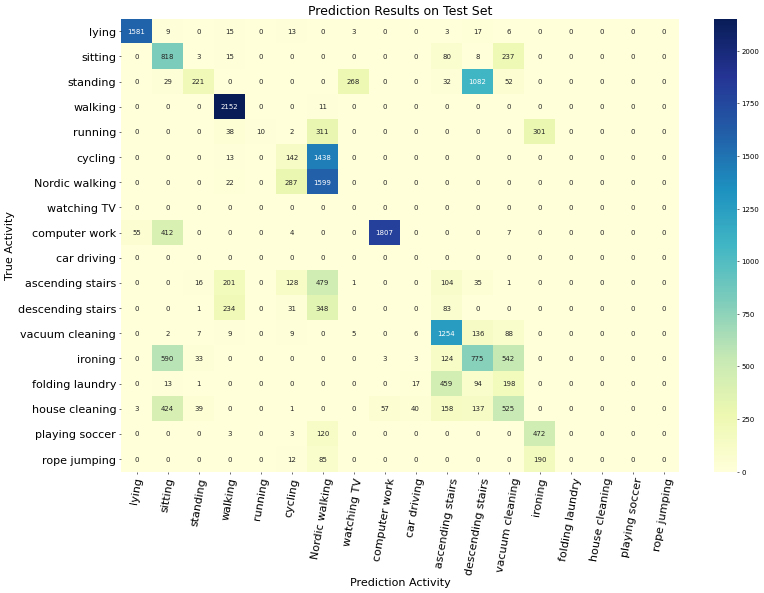

In [ ]:
activities_df = activities_df.reset_index().set_index('ID')
fig , ax = plt.subplots(figsize=(18,12),dpi=50)
sns.heatmap(confusion_matrix(test_lstm_y,results,true),ax=ax,cmap='YlGnBu',annot=True, fmt='g')
label_font = {'size':'16'} 
ax.set_xlabel('Prediction Activity', fontdict=label_font);
ax.set_ylabel('True Activity', fontdict=label_font);

title_font = {'size':'18'}
ax.set_title('Prediction Results on Test Set', fontdict=title_font);
ax.tick_params(axis='both', which='major', labelsize=16) 
true_new = [activities_df.loc[x,'Activity'] for x in true]
ax.set_xticklabels(true_new)
ax.set_yticklabels(true_new)
plt.xticks(rotation=80)
plt.yticks(rotation=0)
plt.show()

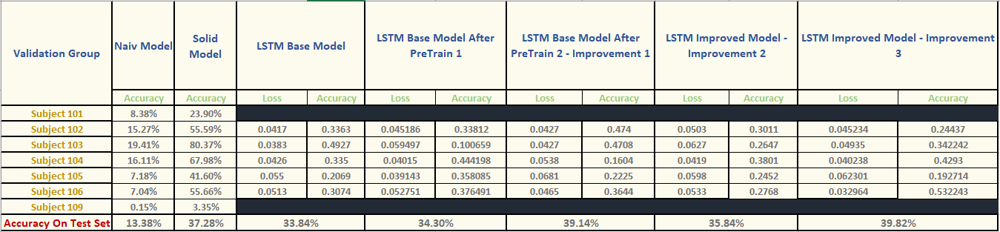

**We can see that we managed to get an improvement on the test set, and in some of the training we managed to deal with overfitting but there are still extreme jumps between the various epochs, we still can not lower the loss values and yet in most cases we are still suffering from overfitting.**

**On the other hand, it can be seen from the examples of the classifications that we were able to separate activities in which we made mistakes in the past, mainly between the activities - soccer and - running and rope jumping.**

**In addition, it can be seen that there are many activities that the models we trained can not separate - the collection of activities of ironing, folding laundry, descending stairs, vacuum cleaning and also the collection of activities - walking, ascending stairs and descending stairs.**
**These activities are relatively similar in terms of the effort and changes that occur in the body as a result of performing these activities and therefore we will need our model to be more sensitive to the small changes that differentiate between these activities.**

# **Summary**

**In this part we encountered many challenges - efficient management of the memory allocated to us in RAM, learning and working with time segments, creating a strategy of validation training - in-depth understanding of the data that will allow us to perform the spliting in the most efficient and correct way.**

**During the work we performed several experiments and several attempts of models to try and understand how things work, how each action we perform and each layer we add will help us, what is the importance of normalization and data preparation in the best way - filling in missing values ​​with concepts of interpolation, finding patterns, self-learning of Model, things we did not deal with in the previous work and now we have come to understand what each thing means and see the impact on the model built and the values ​​we will receive.** 